### LINK TO GitHub repository and notebook

- https://github.com/mohiteamit/the-eye-for-blind
- https://github.com/mohiteamit/the-eye-for-blind/blob/main/eye-for-blind.ipynb

### EYE FOR BLIND: An Image Captioning Project

- This notebook is the capstone project for the EPGP program by Upgrad and IIITB. 

- The project, titled "Eye for Blind," focuses on generating descriptive captions for images.

- The implementation is roughly based on the paper: **"Show, Attend and Tell: Neural Image Caption Generation with Visual Attention"**.

### Quick Tech Review

#### 1. Architecture

* **Encoder**: Inception V3 (top removed) -> extract *mixed7* grid features -> Dense layer projects to common embedding space.
* **Decoder**: LSTM + **Bahdanau Attention** -> attends to image regions each step to predict next word.
* **Attention math**: alignment scores -> weighted context vector -> fed to LSTM with word embed.

#### 2. Training Tricks

* **Feature caching**: save pre-extracted `.npy` files to skip repeat CNN passes.
* **Mixed-precision (AMP)**: `mixed_float16` for speed & lower VRAM.
* **Custom `train_step` (@tf.function)**: fast graph execution, easy add-ons.
* **Gradient clipping**: `tf.clip_by_global_norm` to tame exploding grads.
* **Attention regularizer**: penalty if weights <> 1.0.

#### 3. Data-to-Text Bridging

* **Scheduled sampling**: linearly swap teacher forcing -> self-feeding to cut exposure bias.
* **Beam search (inference)**: keeps top-*k* partial captions + length penalty for balanced outputs.

#### 4. Training Management

* **Early stopping**: halt when val BLEU-4 stalls (patience configurable).

#### 5. Evaluation & Explainability

* **Metrics**: BLEU-1/2/3/4 + timing stats.
* **Attention heat-maps**: visualize focus per generated word.
* **EDA helpers**: caption length histos, word freq, sample previews.
* **Optional TTS**: gTTS turns captions into audio.

---

Result: a lean, cache-efficient, attention-guided captioner that’s fast to train, interpretable, and yields high-quality descriptions.


In [1]:
import os, re, time, random, collections, tqdm, json
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from typing import Dict, List, Tuple, Optional
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

from gtts import gTTS
from IPython.display import Audio, display

###  CONFIGURATION

### flickr30k

In [2]:
CONFIG: Dict[str, object] = {
    # Directory containing image files
    'image_dir': '/home/flickr30k_images/flickr30k_images',
    
    # Path to the captions file
    'caption_file': '/home/flickr30k_images/flickr30k_images/results.csv',
    
    # Directory to cache extracted image features
    'feature_cache_dir': '/home/flickr30k/cache',
    
    # Number of examples to use (None means use all)
    'num_examples': None,
    
    # Maximum length of captions (in tokens)
    'max_caption_length': 50,
    
    # Minimum word frequency for vocabulary pruning
    'min_word_frequency': 5,

    # Embedding dimension for the model
    'embedding_dim': 256,
    
    # Number of units in LSTM
    'units': 512,
    
    # Dropout rate for the decoder
    'decoder_dropout': 0.5,

    # Learning rate for the optimizer
    'learning_rate': 5e-5,
    
    # Number of training epochs
    'epochs': 50,
    
    # Batch size for training
    'batch_size': 128,

    # Buffer size for shuffling the dataset
    'buffer_size': 1000,
    
    # Early stopping patience
    'patience': 8,
    
    # Path to save model checkpoints
    'checkpoint_path': './checkpoints/flickr30k',
    
    # Enable mixed precision training for faster computation
    'mixed_precision': True,

    # Regularization weight for attention alignment
    'attention_reg_lambda': 0.5,
    
    # Gradient clipping value to prevent exploding gradients
    'grad_clip_value': 5.0,
    
    # Maximum probability for scheduled sampling
    'scheduled_sampling_max_prob': 0.2,
    
    # Random seed for reproducibility
    'seed': 42,
}

###  ENV SETUP

In [3]:
# Set random seeds for reproducibility
np.random.seed(CONFIG['seed'])
random.seed(CONFIG['seed'])
tf.random.set_seed(CONFIG['seed'])

# Enable mixed precision training if configured
if CONFIG['mixed_precision']:
    policy = tf.keras.mixed_precision.Policy('mixed_float16')
    tf.keras.mixed_precision.set_global_policy(policy)
    print("[AMP] mixed_float16 policy active")
else:
    print("[AMP] disabled - using float32 throughout")

# Configure GPU memory growth to prevent memory allocation issues
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    for gpu in physical_devices:
        tf.config.experimental.set_memory_growth(gpu, True)
    print(f"Using GPU: {physical_devices[0].name} | batch={CONFIG['batch_size']}")
else:
    print("GPU not found - fallback to CPU")

# Set AUTOTUNE for optimizing data pipeline performance
AUTOTUNE = tf.data.AUTOTUNE

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA RTX 6000 Ada Generation, compute capability 8.9
[AMP] mixed_float16 policy active
Using GPU: /physical_device:GPU:0 | batch=128


###  DATA LOADING AND PREPROCESSING

In [4]:
class DataProcessor:
    """
    Handles loading, preprocessing, and splitting of image-caption data for image captioning.
    - Loads captions and images, checks for missing files.
    - Preprocesses captions (lowercase, remove non-alpha, add tokens).
    - Builds tokenizer and prunes vocab by min_word_frequency.
    - Splits data into train/val/test and pairs images with padded caption sequences.
    - Supports mapping to cached image features.
    - Can display random samples with captions for sanity check.
    """

    def __init__(self, config):
        # Store config and initialize all data structures
        self.config = config
        self.tokenizer: Optional[Tokenizer] = None
        self.img_to_cap_map: Dict[str, List[str]] = collections.defaultdict(list)
        self.image_paths: List[str] = []
        self.all_captions: List[str] = []
        self.train_data: List[Tuple[str, List[int]]] = []
        self.val_data: List[Tuple[str, List[int]]] = []
        self.test_data: List[Tuple[str, List[int]]] = []
        self.max_caption_length = 0
        self.vocab_size = 0
        self.num_steps_per_epoch = 0

    def load_and_preprocess_data(self):
        """
        Loads captions from CSV or pipe-delimited file, checks image existence,
        preprocesses captions, builds tokenizer, prunes vocab, and computes max caption length.
        """
        import pandas as pd
        import os
        import collections
        import random
        import tqdm
        from keras.preprocessing.text import Tokenizer

        print("Loading and preprocessing captions...")
        file_path = self.config['caption_file']

        # Detect file format by peeking at the header
        with open(file_path, 'r', encoding='utf-8') as f:
            header_line = f.readline()

        if 'image,caption' in header_line:
            # Standard comma-separated format
            df = pd.read_csv(file_path, engine='python')
            df = df[['image', 'caption']]
        elif 'image_name' in header_line and 'comment' in header_line:
            # Pipe-delimited format with extra comment_number column
            df = pd.read_csv(file_path, sep='|', engine='python')
            df = df.rename(columns={'image_name': 'image', 'comment': 'caption'})
            df = df[['image', 'caption']]
        else:
            # Fallback: try automatic delimiter inference and rename
            df = pd.read_csv(file_path, sep=None, engine='python')
            if 'image_name' in df.columns and 'image' not in df.columns:
                df = df.rename(columns={'image_name': 'image'})
            if 'comment' in df.columns and 'caption' not in df.columns:
                df = df.rename(columns={'comment': 'caption'})
            df = df[['image', 'caption']]

        # Clean whitespace
        df['image'] = df['image'].str.strip()
        df['caption'] = df['caption'].str.strip()

        df['caption'] = df['caption'].str.strip()
        df = df.dropna(subset=['caption'])      # drop rows where caption is NaN
        df = df[df['caption'] != '']             # then drop any that are now empty strings

        # Map images to processed captions
        temp_img_to_cap_map = collections.defaultdict(list)
        all_unique_img_names_from_csv = df['image'].unique()

        print(f"Checking {len(all_unique_img_names_from_csv)} unique image files from captions file...")
        found_images_count = 0

        existing_image_files = set(os.listdir(self.config['image_dir']))

        for _, row in tqdm.tqdm(df.iterrows(), total=df.shape[0], desc="Validating images & processing captions"):
            img_name = row['image']
            caption = row['caption']

            if img_name in existing_image_files:
                temp_img_to_cap_map[img_name].append(self.preprocess_text(caption))
                if img_name not in self.img_to_cap_map:
                    found_images_count += 1
                self.img_to_cap_map[img_name] = temp_img_to_cap_map[img_name]

        missing = len(all_unique_img_names_from_csv) - found_images_count
        if missing > 0:
            print(f"Warning: {missing} images mentioned in captions file were not found in {self.config['image_dir']}. They have been discarded.")

        # Finalize image paths
        self.image_paths = sorted(list(self.img_to_cap_map.keys()))

        # Optionally sample a subset
        if self.config.get('num_examples'):
            if len(self.image_paths) > self.config['num_examples']:
                self.image_paths = random.sample(self.image_paths, self.config['num_examples'])
                self.img_to_cap_map = {img: self.img_to_cap_map[img] for img in self.image_paths}
                print(f"Using a subset of {len(self.image_paths)} images due to 'num_examples' config.")

        # Flatten all captions
        self.all_captions = []
        for img_name in self.image_paths:
            self.all_captions.extend(self.img_to_cap_map[img_name])

        print(f"Total valid images (with captions): {len(self.image_paths)}")
        print(f"Total valid captions: {len(self.all_captions)}")

        # Build tokenizer and prune vocab
        self.tokenizer = Tokenizer(
            num_words=None,
            oov_token="<unk>",
            filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ',
            lower=True
        )
        self.tokenizer.fit_on_texts(self.all_captions)

        word_counts = collections.Counter(
            word for caption in self.all_captions for word in caption.split()
        )
        filtered_word_index = {
            word: index for word, index in self.tokenizer.word_index.items()
            if word_counts[word] >= self.config['min_word_frequency'] or word in ['<pad>', '<start>', '<end>', '<unk>']
        }
        self.tokenizer.word_index = filtered_word_index
        self.tokenizer.index_word = {v: k for k, v in filtered_word_index.items()}

        # Ensure special tokens
        special_tokens = ['<pad>', '<start>', '<end>', '<unk>']
        next_index = len(self.tokenizer.word_index) + 1
        for token in special_tokens:
            if token not in self.tokenizer.word_index:
                self.tokenizer.word_index[token] = next_index
                self.tokenizer.index_word[next_index] = token
                next_index += 1

        # Determine vocab size and max caption length
        self.vocab_size = len(self.tokenizer.word_index) + 1
        print(f"Vocabulary size after pruning (min_word_frequency={self.config['min_word_frequency']}): {self.vocab_size}")

        all_seqs = self.tokenizer.texts_to_sequences(self.all_captions)
        self.max_caption_length = max(len(s) for s in all_seqs)
        self.config['max_caption_length'] = self.max_caption_length
        print(f"Max caption length: {self.max_caption_length}")

        
    def preprocess_text(self, caption: str) -> str:
        """
        Lowercases, removes non-alpha chars, trims, and adds <start>/<end> tokens.
        """
        caption = caption.lower()
        caption = re.sub(r"[^a-z ]", "", caption)
        caption = re.sub(r'\s+', ' ', caption).strip()
        caption = '<start> ' + caption + ' <end>'
        return caption

    def create_dataset_splits(self, train_ratio=0.8, val_ratio=0.1):
        """
        Shuffles and splits image paths into train/val/test, then pairs with captions.
        """
        random.shuffle(self.image_paths)
        num_images = len(self.image_paths)
        num_train = int(train_ratio * num_images)
        num_val = int(val_ratio * num_images)

        train_image_paths = self.image_paths[:num_train]
        val_image_paths = self.image_paths[num_train:num_train + num_val]
        test_image_paths = self.image_paths[num_train + num_val:]

        print(f"Train images: {len(train_image_paths)}, Val images: {len(val_image_paths)}, Test images: {len(test_image_paths)}")

        self.train_data = self._create_pairs(train_image_paths)
        self.val_data = self._create_pairs(val_image_paths)
        self.test_data = self._create_pairs(test_image_paths)

        print(f"Train pairs: {len(self.train_data)}, Val pairs: {len(self.val_data)}, Test pairs: {len(self.test_data)}")

        self.num_steps_per_epoch = len(self.train_data) // self.config['batch_size']

    def _create_pairs(self, image_names: List[str]) -> List[Tuple[str, List[int]]]:
        """
        For each image, pairs it with all its captions (as padded int sequences).
        """
        pairs = []
        for img_name in image_names:
            full_img_path = os.path.join(self.config['image_dir'], img_name)
            for caption in self.img_to_cap_map[img_name]:
                seq = self.tokenizer.texts_to_sequences([caption])[0]
                padded_seq = pad_sequences([seq], maxlen=self.max_caption_length, padding='post')[0]
                pairs.append((full_img_path, list(padded_seq)))
        return pairs

    def get_data_with_cached_features(self, image_name_to_cached_path_map: Dict[str, str]) -> Tuple[List, List, List]:
        """
        Replaces image paths with cached feature paths if available, for all splits.
        Only keeps pairs where cached features exist.
        """
        def _reconstruct_list(data_list):
            reconstructed = []
            for original_img_path, caption_ids in data_list:
                basename = os.path.basename(original_img_path)
                cached_path = image_name_to_cached_path_map.get(basename)
                if cached_path and os.path.exists(cached_path): # Added check if cached file actually exists
                    reconstructed.append((original_img_path, cached_path, caption_ids))
            return reconstructed

        final_train = _reconstruct_list(self.train_data)
        final_val = _reconstruct_list(self.val_data)
        final_test = _reconstruct_list(self.test_data)

        print(f"Adjusted train pairs (after feature caching check): {len(final_train)}")
        print(f"Adjusted val pairs (after feature caching check): {len(final_val)}")
        print(f"Adjusted test pairs (after feature caching check): {len(final_test)}")
        
        return final_train, final_val, final_test

    def display_samples(self, num_samples: int = 5):
        """
        Randomly picks a few images and displays them with their ground truth captions.
        Useful for sanity check of data loading and preprocessing.
        """
        print(f"\n--- Displaying {num_samples} Random Dataset Samples ---")

        # Get a list of all image paths that have associated captions
        available_image_paths = sorted(list(self.img_to_cap_map.keys()))

        if not available_image_paths:
            print("No image paths with captions available to display.")
            return

        # Randomly select a few image names
        samples_to_display = random.sample(available_image_paths, min(num_samples, len(available_image_paths)))

        for i, img_name in enumerate(samples_to_display):
            full_image_path = os.path.join(self.config['image_dir'], img_name)

            if not os.path.exists(full_image_path):
                print(f"Warning: Image file not found for {img_name} at {full_image_path}. Skipping.")
                continue

            print(f"\n--- Sample {i+1}/{num_samples} ---")
            print(f"Image Name: {img_name}")

            try:
                img = Image.open(full_image_path)
                plt.figure(figsize=(8, 6))
                plt.imshow(img)
                plt.title(f"Image: {img_name}")
                plt.axis('off')
                plt.show()
            except Exception as e:
                print(f"Error loading or displaying image {img_name}: {e}")
                continue

            gt_captions = self.img_to_cap_map.get(img_name, [])
            print("Ground Truth Captions:")
            if gt_captions:
                for j, cap in enumerate(gt_captions):
                    # Clean up <start> and <end> tokens for display
                    clean_cap = cap.replace('<start>', '').replace('<end>', '').strip()
                    print(f"  {j+1}. {clean_cap}")
            else:
                print("  No ground truth captions available for this image.")

    def plot_caption_length_histogram(self):
        caption_lengths = [len(s.split()) for s in self.all_captions]
        plt.figure(figsize=(10, 6))
        plt.hist(caption_lengths, bins=range(min(caption_lengths), max(caption_lengths) + 2), edgecolor='black')
        plt.title('Histogram of Caption Lengths')
        plt.xlabel('Caption Length (words)')
        plt.ylabel('Number of Captions')
        plt.grid(axis='y', alpha=0.75)
        plt.show()

    def plot_top_words(self, top_n: int = 20):
        words = [word for caption in self.all_captions for word in caption.split() 
                if word not in ['<start>', '<end>', '<pad>', '<unk>']]
        word_counts = collections.Counter(words)
        top_words = word_counts.most_common(top_n)
        words_df = pd.DataFrame(top_words, columns=['Word', 'Frequency'])

        plt.figure(figsize=(12, 7))
        sns.barplot(x='Frequency', y='Word', hue='Word', data=words_df, palette='viridis', legend=False)
        plt.title(f'Top {top_n} Most Frequent Words (excluding special tokens)')
        plt.xlabel('Frequency')
        plt.ylabel('Word')
        plt.show()

    def plot_sample_images_with_caption(self, num_images: int = 6):
        selected_images = random.sample(self.image_paths, min(num_images, len(self.image_paths)))
        
        fig, axes = plt.subplots(3, 2, figsize=(10, 15)) # 3 rows, 2 columns for 6 images
        axes = axes.flatten()

        for i, img_name in enumerate(selected_images):
            full_path = os.path.join(self.config['image_dir'], img_name)
            if not os.path.exists(full_path):
                print(f"Warning: Image {img_name} not found. Skipping.")
                continue

            try:
                img = Image.open(full_path)
                ax = axes[i]
                ax.imshow(img)
                ax.set_title(f"{img_name}\nCap: {self.img_to_cap_map[img_name][0].replace('<start>','').replace('<end>','').strip()}", fontsize=10)
                ax.axis('off')
            except Exception as e:
                print(f"Error loading image {img_name}: {e}")
                axes[i].set_title("Image Load Error")
                axes[i].axis('off')
                continue

        # Hide any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])
            
        plt.tight_layout()
        plt.show()

###  IMAGE FEATURE EXTRACTION (CACHE FEATURES)

In [5]:
class ImageFeatureExtractor(Model):
    """
    Extracts image features using a pre-trained InceptionV3 model.
    - Resizes images to target size and preprocesses them for InceptionV3.
    - Extracts features from the 'mixed7' layer of the model.
    """

    def __init__(self, target_size=(299, 299)):
        """
        Initializes the feature extractor with InceptionV3.
        - Freezes the model to prevent training.
        - Extracts features from the 'mixed7' layer.
        """
        super().__init__()
        self.target_size = target_size
        self.inception_v3 = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
        self.inception_v3.trainable = False  # Freeze the model
        self.feature_extractor = Model(inputs=self.inception_v3.input,
                                       outputs=self.inception_v3.get_layer('mixed7').output)

    @tf.function
    def load_and_preprocess_image(self, image_path: tf.Tensor) -> tf.Tensor:
        """
        Loads and preprocesses an image for feature extraction.
        - Reads the image from the given path.
        - Decodes and resizes it to the target size.
        - Applies InceptionV3 preprocessing.
        """
        img = tf.io.read_file(image_path)  # Read image file
        img = tf.image.decode_jpeg(img, channels=3)  # Decode JPEG image
        img = tf.image.resize(img, self.target_size)  # Resize to target size
        img = tf.keras.applications.inception_v3.preprocess_input(img)  # Preprocess for InceptionV3
        return img

In [6]:
class ImageFeatureCacheManager:
    """
    Manages extraction and caching of image features using a pre-trained CNN.
    
    Extracts features from the 'mixed7' layer of InceptionV3 and saves them as .npy files
    for faster training. Features are reshaped to (289, 768) representing 17x17 spatial
    locations with 768-dimensional feature vectors.
    """
    
    def __init__(self, config, feature_extractor: ImageFeatureExtractor):
        self.config = config
        self.feature_extractor = feature_extractor
        self.cache_dir = config['feature_cache_dir']
        os.makedirs(self.cache_dir, exist_ok=True)

    def manage_feature_cache(self, image_names: List[str]) -> Dict[str, str]:
        """
        Checks for existing cached features and extracts new ones if needed.
        
        Processes images in batches to efficiently extract CNN features using GPU.
        Returns mapping from image names to their corresponding cache file paths.
        Skips images that fail feature extraction to avoid training errors.
        """
        print(f"\nManaging image feature cache in: {self.cache_dir}")
        print(f"Checking/extracting features for {len(image_names)} unique images.")

        image_name_to_cached_path = {}
        images_to_extract = []

        # Check which images need feature extraction
        for img_name in image_names:
            cache_file = os.path.join(self.cache_dir, img_name + '.npy')
            if not os.path.exists(cache_file):
                images_to_extract.append(img_name)
            image_name_to_cached_path[img_name] = cache_file

        if images_to_extract:
            print(f"Found {len(images_to_extract)} images whose features need extraction...")
            
            full_paths_for_extraction = [os.path.join(self.config['image_dir'], img_name) for img_name in images_to_extract]

            batch_size_extraction = 16 # Adjust based on your GPU memory
            for i in tqdm.tqdm(range(0, len(full_paths_for_extraction), batch_size_extraction), desc="Extracting & Caching Features"):
                batch_paths = full_paths_for_extraction[i:i+batch_size_extraction]
                
                try:
                    # Preprocess images and extract features in batch
                    img_tensors_processed = tf.stack([self.feature_extractor.load_and_preprocess_image(tf.constant(p)) for p in batch_paths])
                    
                    features_batch = self.feature_extractor.feature_extractor(img_tensors_processed)
                    
                    # Reshape to (batch_size, 17*17, 768) for attention mechanism
                    features_flat_batch = tf.reshape(features_batch, (tf.shape(features_batch)[0], -1, tf.shape(features_batch)[3]))
                    
                    # Save features for each image separately
                    for j, img_path in enumerate(batch_paths):
                        img_name = os.path.basename(img_path)
                        cache_path = os.path.join(self.cache_dir, img_name + '.npy')
                        # Save each image's features separately as (289, 768)
                        np.save(cache_path, features_flat_batch[j].numpy())
                except Exception as e:
                    print(f"\nError processing a batch during feature extraction: {e}. Skipping images in this batch.")
                    # Remove failed images from the mapping to prevent training issues
                    for img_path_in_batch in batch_paths:
                        img_name_in_batch = os.path.basename(img_path_in_batch)
                        # Remove from map if feature extraction failed, so it's not used
                        if img_name_in_batch in image_name_to_cached_path:
                            del image_name_to_cached_path[img_name_in_batch]
                    continue
        else:
            print("All image features already cached. Skipping extraction.")
            
        print("Image feature cache management complete.")
        return image_name_to_cached_path

###  MODEL ARCHITECTURE

In [7]:
class Encoder(Model):
    """
    Encoder transforms CNN features to embedding space for the decoder.
    Uses a fully connected layer to project image features to embedding dimension.
    """
    def __init__(self, embedding_dim):
        super(Encoder, self).__init__()
        self.fc = layers.Dense(embedding_dim)

    def call(self, x):
        # Project image features to embedding dimension
        x = self.fc(x)
        return x

class BahdanauAttention(layers.Layer):
    """
    Bahdanau attention mechanism for focusing on relevant image regions.
    Computes attention weights using additive attention with tanh activation.
    Returns context vector and attention weights for visualization.
    """
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        # Dense layers for computing attention scores
        self.W1 = layers.Dense(units)  # Transform features
        self.W2 = layers.Dense(units)  # Transform hidden state
        self.V = layers.Dense(1)       # Final attention score

    def call(self, features, hidden):
        # Add time dimension to hidden state for broadcasting
        hidden_with_time_axis = tf.expand_dims(hidden, 1)
        
        # Compute attention scores using additive attention
        score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        
        # Convert scores to probabilities
        attention_weights = tf.nn.softmax(self.V(score), axis=1)
        
        # Compute weighted sum of features
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)
        
        return context_vector, tf.squeeze(attention_weights, -1)

class Decoder(Model):
    """
    LSTM-based decoder with attention for generating captions word by word.
    Takes embedded words and attended image features to predict next word.
    Handles mixed precision training by casting states to appropriate dtype.
    """
    def __init__(self, embedding_dim, units, vocab_size, dropout=0.5):
        super(Decoder, self).__init__()
        self.units = units
        
        # Word embedding layer
        self.embedding = layers.Embedding(vocab_size, embedding_dim)
        
        # LSTM with dropout for regularization
        self.lstm = layers.LSTM(self.units,
                                 return_sequences=True,
                                 return_state=True,
                                 recurrent_initializer='glorot_uniform',
                                 dropout=dropout)

        # Dense layers for output projection
        self.fc1 = layers.Dense(self.units)
        self.fc2 = layers.Dense(vocab_size, dtype='float32')  # Always float32 for stable logits

        # Attention mechanism
        self.attention = BahdanauAttention(self.units)

    def call(self, x, features, hidden_state, cell_state):
        # Get context vector from attention
        context_vector, attention_weights = self.attention(features, hidden_state)

        # Embed input word
        x = self.embedding(x)

        # Concatenate context and embedded word
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # Handle mixed precision by casting to float16 if needed
        if tf.keras.mixed_precision.global_policy().compute_dtype == 'float16':
            hidden_state = tf.cast(hidden_state, tf.float16)
            cell_state = tf.cast(cell_state, tf.float16)
            x = tf.cast(x, tf.float16)

        # Pass through LSTM
        output, new_hidden_state, new_cell_state = self.lstm(x, initial_state=[hidden_state, cell_state])

        # Flatten for dense layer
        output = tf.reshape(output, (-1, output.shape[2]))

        # Project to vocabulary size
        x = self.fc1(output)
        logits = self.fc2(x)

        return logits, new_hidden_state, new_cell_state, attention_weights

###  TEXT-TO-SPEECH UTILITY

In [8]:
class TextToSpeech:
    """
    Simple wrapper around gTTS (Google Text-to-Speech) for audio playback in Jupyter.
    Handles import errors gracefully and provides audio generation for generated captions.
    """
    
    def __init__(self):
        try:
            self.gTTS = gTTS
            self.Audio = Audio
            self.display = display
            self.available = True
        except ImportError:
            print("WARNING: gTTS or IPython.display not found. Speech functionality will be disabled.")
            self.available = False

    def speak(self, text: str, filename: str = "caption_audio.mp3"):
        """
        Converts text to speech and plays audio in Jupyter notebook.
        Saves audio file locally and uses IPython.display.Audio for playback.
        """
        if not self.available:
            print("Text-to-speech functionality is not available. Please install 'gtts' and ensure running in an IPython environment.")
            return
        
        if not text.strip():
            print("Empty text, nothing to speak.")
            return
        
        try:
            # Generate speech audio file
            tts = self.gTTS(text=text, lang='en')
            tts.save(filename)
            # Play audio in notebook
            self.display(self.Audio(filename))
            print(f"Audio saved to {filename} and played.")
        except Exception as e:
            print(f"Error generating or playing audio: {e}")

###  TRAINING LOOP & UTILITIES

In [9]:
class ImageCaptioning:
    """
    Main image captioning model that combines encoder-decoder architecture with attention mechanism.
    Uses pre-extracted image features and generates captions using greedy search or beam search.
    Includes training loop with early stopping, BLEU evaluation, and visualization capabilities.
    """
    
    def __init__(self, config, processor: DataProcessor, feature_extractor: ImageFeatureExtractor):
        self.config = config
        self.processor = processor
        self.feature_extractor = feature_extractor

        self.encoder = Encoder(self.config['embedding_dim'])
        self.decoder = Decoder(self.config['embedding_dim'], self.config['units'],
                               self.processor.vocab_size, self.config['decoder_dropout'])

        self.optimizer = tf.keras.optimizers.Adam(learning_rate=self.config['learning_rate'])
        if self.config['mixed_precision']:
            self.optimizer = tf.keras.mixed_precision.LossScaleOptimizer(self.optimizer)

        self.loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
            from_logits=True, reduction='none')

        self.checkpoint_prefix = os.path.join(self.config['checkpoint_path'], "ckpt")
        self.checkpoint = tf.train.Checkpoint(encoder=self.encoder,
                                             decoder=self.decoder,
                                             optimizer=self.optimizer)
        self.checkpoint_manager = tf.train.CheckpointManager(self.checkpoint, self.config['checkpoint_path'], max_to_keep=5)

        self.tts_speaker = TextToSpeech()

        # Initialize history lists (will be loaded if checkpoint exists)
        self.train_loss_results = []
        self.val_bleu_results = []
        self.best_val_bleu = 0.0
        self.patience_counter = 0
        self.smoothing_function = SmoothingFunction().method4

        # Paths for history files
        self.train_loss_history_path = os.path.join(self.config['checkpoint_path'], "train_loss_history.json")
        self.val_bleu_history_path = os.path.join(self.config['checkpoint_path'], "val_bleu_history.json")
        self.best_val_bleu_path = os.path.join(self.config['checkpoint_path'], "best_val_bleu.txt")
        self.patience_counter_path = os.path.join(self.config['checkpoint_path'], "patience_counter.txt")


        if self.checkpoint_manager.latest_checkpoint:
            self.checkpoint.restore(self.checkpoint_manager.latest_checkpoint)
            print(f"Restored from {self.checkpoint_manager.latest_checkpoint}")
            self._load_history() # Load history after restoring checkpoint
        else:
            print("Initializing from scratch.")
        
        # Ensure checkpoint path exists for saving history files
        os.makedirs(self.config['checkpoint_path'], exist_ok=True)

    def _save_history(self):
        """Saves training history and best metric/patience to files."""
        try:
            with open(self.train_loss_history_path, 'w') as f:
                # Convert numpy floats to native floats for JSON serialization
                json.dump([float(x) for x in self.train_loss_results], f)
            with open(self.val_bleu_history_path, 'w') as f:
                json.dump([float(x) for x in self.val_bleu_results], f)
            with open(self.best_val_bleu_path, 'w') as f:
                f.write(str(self.best_val_bleu))
            with open(self.patience_counter_path, 'w') as f:
                f.write(str(self.patience_counter))
            print("Training history and states saved.")
        except Exception as e:
            print(f"Warning: Could not save training history and states: {e}")

    def _load_history(self):
        """Loads training history and best metric/patience from files."""
        try:
            if os.path.exists(self.train_loss_history_path):
                with open(self.train_loss_history_path, 'r') as f:
                    self.train_loss_results = json.load(f)
            if os.path.exists(self.val_bleu_history_path):
                with open(self.val_bleu_history_path, 'r') as f:
                    self.val_bleu_results = json.load(f)
            if os.path.exists(self.best_val_bleu_path):
                with open(self.best_val_bleu_path, 'r') as f:
                    self.best_val_bleu = float(f.read())
            if os.path.exists(self.patience_counter_path):
                with open(self.patience_counter_path, 'r') as f:
                    self.patience_counter = int(f.read())
            print("Training history and states loaded.")
        except Exception as e:
            print(f"Warning: Could not load training history and states: {e}")

    def loss_function(self, real, pred):
        mask = tf.math.logical_not(tf.math.equal(real, 0))
        loss_ = self.loss_object(real, pred)
        mask = tf.cast(mask, dtype=loss_.dtype)
        loss_ *= mask
        return tf.reduce_mean(loss_)

    @tf.function
    def train_step(self, img_tensor, target):
        batch_size = tf.shape(target)[0]
        loss = 0.0

        current_policy = tf.keras.mixed_precision.global_policy()
        if current_policy.name == 'mixed_float16':
            initial_state_dtype = tf.float16
        else:
            initial_state_dtype = tf.float32

        hidden = tf.zeros((batch_size, self.config['units']), dtype=initial_state_dtype)
        cell = tf.zeros((batch_size, self.config['units']), dtype=initial_state_dtype)

        dec_input = tf.fill([batch_size, 1], self.processor.tokenizer.word_index['<start>'])

        with tf.GradientTape() as tape:
            features = self.encoder(img_tensor)

            attention_sum_square_error = tf.constant(0.0, dtype=tf.float32)

            for i in tf.range(1, target.shape[1]):
                predictions, hidden, cell, attention_weights = self.decoder(dec_input, features, hidden, cell)

                loss += self.loss_function(target[:, i], predictions)

                if self.config.get('scheduled_sampling_max_prob', 0.0) > 0:
                    random_probs = tf.random.uniform([batch_size], 0, 1, dtype=tf.float32)
                    
                    threshold = tf.fill([batch_size], self.current_scheduled_sampling_prob)
                    
                    use_predicted_mask = random_probs < threshold
                    
                    predicted_ids = tf.argmax(predictions, axis=1, output_type=tf.int32)
                    
                    true_ids = target[:, i]
                    
                    dec_input = tf.where(use_predicted_mask, predicted_ids, true_ids)
                    
                    dec_input = tf.expand_dims(dec_input, 1)
                else:
                    dec_input = tf.expand_dims(target[:, i], 1)

                attention_sum_square_error += tf.reduce_mean(
                    tf.square(tf.cast(tf.reduce_sum(attention_weights, axis=1), tf.float32) - 1.0)
                )

            total_loss = (loss / tf.cast(target.shape[1] - 1, tf.float32))
            total_loss += self.config['attention_reg_lambda'] * attention_sum_square_error / tf.cast(target.shape[1] - 1, tf.float32)

            if self.config['mixed_precision']:
                scaled_loss = self.optimizer.get_scaled_loss(total_loss)
            else:
                scaled_loss = total_loss

        trainable_variables = self.encoder.trainable_variables + self.decoder.trainable_variables
        gradients = tape.gradient(scaled_loss, trainable_variables)

        if self.config['mixed_precision']:
            gradients = self.optimizer.get_unscaled_gradients(gradients)

        gradients, _ = tf.clip_by_global_norm(gradients, self.config['grad_clip_value'])
        self.optimizer.apply_gradients(zip(gradients, trainable_variables))

        return total_loss

    def evaluate_bleu_score(self, dataset_pairs: List[Tuple[str, List[int]]], num_samples=None):
        references = []
        hypotheses = []

        if num_samples is None:
            samples_to_evaluate = dataset_pairs
        else:
            samples_to_evaluate = random.sample(dataset_pairs, min(num_samples, len(dataset_pairs)))

        print(f"\nEvaluating BLEU on {len(samples_to_evaluate)} samples...")
        for img_path, _ in tqdm.tqdm(samples_to_evaluate):
            generated_caption_tokens = self.greedy_inference(img_path)
            
            if not generated_caption_tokens:
                generated_caption_tokens, _ = self.beam_search_inference(img_path, beam_size=3)

            if not generated_caption_tokens:
                continue

            hypotheses.append(generated_caption_tokens)

            img_name = os.path.basename(img_path)
            raw_captions = self.processor.img_to_cap_map.get(img_name, [])
            
            img_references = []
            for raw_cap in raw_captions:
                cleaned_cap = raw_cap.replace('<start>', '').replace('<end>', '').strip()
                if cleaned_cap:
                    img_references.append(cleaned_cap.split())
            
            if img_references:
                references.append(img_references)
            else:
                hypotheses.pop()

        if not references:
            print("No valid reference captions found for BLEU evaluation after filtering.")
            return {"bleu-1": 0.0, "bleu-2": 0.0, "bleu-3": 0.0, "bleu-4": 0.0}

        bleu_scores = {}
        for n in range(1, 5):
            weights = (1.0 / n,) * n + (0.0,) * (4 - n)
            bleu_scores[f"bleu-{n}"] = corpus_bleu(references, hypotheses, weights=weights,
                                                   smoothing_function=self.smoothing_function)
            print(f"BLEU-{n}: {bleu_scores[f'bleu-{n}']:.4f}")
            
        return bleu_scores

    def greedy_inference(self, image_path: str):
        filename = os.path.basename(image_path)
        feature_cache_path = os.path.join(self.config['feature_cache_dir'], filename + '.npy')
        
        if not os.path.exists(feature_cache_path):
            print(f"Error: Feature cache not found for {image_path}")
            return []

        img_features = np.load(feature_cache_path)
        img_features_tensor = tf.convert_to_tensor(img_features, dtype=tf.float32)
        
        img_features_tensor = tf.expand_dims(img_features_tensor, 0)

        features = self.encoder(img_features_tensor)

        hidden = tf.zeros((1, self.config['units']), dtype=tf.float32)
        cell = tf.zeros((1, self.config['units']), dtype=tf.float32)

        dec_input = tf.expand_dims([self.processor.tokenizer.word_index['<start>']], 0)

        result = []
        for i in range(self.config['max_caption_length']):
            predictions, hidden, cell, _ = self.decoder(dec_input, features, hidden, cell)
            predicted_id = tf.argmax(predictions[0]).numpy()
            predicted_word = self.processor.tokenizer.index_word.get(predicted_id, '<unk>')

            if predicted_word == '<end>':
                break
            if predicted_word not in ('<unk>', '<start>', '<pad>'):
                result.append(predicted_word)

            dec_input = tf.expand_dims([predicted_id], 0)

        return result

    def beam_search_inference(self, image_path: str, beam_size: int = 3, length_penalty_weight: float = 0.7):
        filename = os.path.basename(image_path)
        feature_cache_path = os.path.join(self.config['feature_cache_dir'], filename + '.npy')
        if not os.path.exists(feature_cache_path):
            print(f"Error: Feature cache not found for {image_path}")
            return [], []

        img_features = np.load(feature_cache_path)
        img_features_tensor = tf.convert_to_tensor(img_features, dtype=tf.float32)
        
        img_features_tensor = tf.expand_dims(img_features_tensor, 0)

        features = self.encoder(img_features_tensor)

        start_token = self.processor.tokenizer.word_index['<start>']
        end_token = self.processor.tokenizer.word_index['<end>']

        beams = [(
            [start_token],
            0.0,
            tf.zeros((1, self.config['units']), dtype=tf.float32),
            tf.zeros((1, self.config['units']), dtype=tf.float32),
            []
        )]

        completed_beams = []

        for _ in range(self.config['max_caption_length']):
            temp_active_beams = []
            for seq, score, hidden, cell, alphas in beams:
                last_token = seq[-1]

                if last_token == end_token:
                    completed_beams.append((seq, score, alphas))
                    continue

                dec_input = tf.expand_dims([last_token], 0)
                
                predictions, new_hidden, new_cell, attention_weights = self.decoder(dec_input, features, hidden, cell)

                predictions = tf.cast(predictions[0], tf.float32)
                log_probs = tf.nn.log_softmax(predictions).numpy()

                top_k_indices = np.argsort(log_probs)[::-1][:beam_size]

                for idx in top_k_indices:
                    token_id = int(idx)
                    token_log_prob = float(log_probs[idx])
                    
                    temp_active_beams.append((
                        seq + [token_id],
                        score + token_log_prob,
                        new_hidden,
                        new_cell,
                        alphas + [attention_weights[0].numpy()]
                    ))
            
            temp_active_beams.sort(key=lambda x: x[1] / ((len(x[0]) ** length_penalty_weight) if len(x[0]) > 0 else 1.0), reverse=True)
            beams = temp_active_beams[:beam_size]

            if all(b[0][-1] == end_token for b in beams):
                completed_beams.extend([(b[0], b[1], b[4]) for b in beams])
                break
        
        completed_beams.extend([(seq, score, alphas) for seq, score, hidden, cell, alphas in beams if seq[-1] != end_token])

        if not completed_beams:
            return [], []

        best_seq, best_score, best_alphas = max(completed_beams, key=lambda x: x[1] / ((len(x[0]) ** length_penalty_weight) if len(x[0]) > 0 else 1.0))

        caption_words = [self.processor.tokenizer.index_word.get(i, '<unk>') for i in best_seq]
        
        filtered_caption_words = [
            word for word in caption_words
            if word not in ['<start>', '<end>', '<pad>', '<unk>']
        ]

        return filtered_caption_words, best_alphas

    def train(self, train_cached_paths: List[Tuple[str, str, List[int]]],
              val_dataset_pairs: List[Tuple[str, List[int]]]):
        
        def _data_generator():
            for orig_img_path, cache_path, caption_ids in train_cached_paths:
                features = np.load(cache_path)
                features = tf.cast(features, tf.float32)
                yield features, np.array(caption_ids, dtype=np.int32)

        train_dataset = tf.data.Dataset.from_generator(
            _data_generator,
            output_signature=(
                tf.TensorSpec(shape=(289, 768), dtype=tf.float32),
                tf.TensorSpec(shape=(self.config['max_caption_length'],), dtype=tf.int32)
            )
        )
        train_dataset = train_dataset.shuffle(self.config['buffer_size']).batch(self.config['batch_size'])
        train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)

        self.processor.num_steps_per_epoch = len(train_cached_paths) // self.config['batch_size']
        if self.processor.num_steps_per_epoch == 0:
            print("Warning: num_steps_per_epoch is 0. Batch size might be too large or dataset too small. Setting to 1.")
            self.processor.num_steps_per_epoch = 1

        initial_epoch = tf.cast(self.optimizer.iterations, tf.float32) // self.processor.num_steps_per_epoch
        initial_epoch = tf.cast(initial_epoch, tf.int32).numpy()

        print(f"Resuming training from epoch {initial_epoch + 1}.")
        print(f"Targeting a total of {self.config['epochs']} epochs.")

        for epoch in range(initial_epoch, self.config['epochs']):
            start = time.time()
            total_loss = 0

            self.current_scheduled_sampling_prob = (
                self.config['scheduled_sampling_max_prob'] * (epoch / max(1, self.config['epochs'] - 1))
            )
            print(f"\nEpoch {epoch+1}/{self.config['epochs']} (Scheduled Sampling Prob: {self.current_scheduled_sampling_prob:.3f})")

            for (batch, (img_tensor, target)) in enumerate(train_dataset):
                batch_loss = self.train_step(img_tensor, target)
                total_loss += batch_loss

                if (self.optimizer.iterations.numpy() % 100 == 0) and (self.optimizer.iterations.numpy() > 0):
                    print(f'Global Step {self.optimizer.iterations.numpy()} Batch {batch} Loss {batch_loss.numpy():.4f}')
            
            avg_train_loss = total_loss / self.processor.num_steps_per_epoch
            
            # Ensure train_loss_results has enough entries for the current epoch
            if len(self.train_loss_results) <= epoch:
                self.train_loss_results.append(avg_train_loss.numpy())
            else:
                self.train_loss_results[epoch] = avg_train_loss.numpy()

            print(f'Epoch {epoch+1} Loss {avg_train_loss:.4f}')

            val_bleu_scores = self.evaluate_bleu_score(val_dataset_pairs, num_samples=min(1000, len(val_dataset_pairs)))
            current_val_bleu4 = val_bleu_scores.get('bleu-4', 0.0)
            
            # Ensure val_bleu_results has enough entries for the current epoch
            if len(self.val_bleu_results) <= epoch:
                self.val_bleu_results.append(current_val_bleu4)
            else:
                self.val_bleu_results[epoch] = current_val_bleu4

            if current_val_bleu4 > self.best_val_bleu:
                self.best_val_bleu = current_val_bleu4
                self.checkpoint_manager.save()
                self._save_history() # Save history whenever a checkpoint is saved
                print(f"Saving checkpoint at epoch {epoch+1} with BLEU-4: {current_val_bleu4:.4f}")
                self.patience_counter = 0
            else:
                self.patience_counter += 1
                print(f"BLEU-4 not improved. Patience counter: {self.patience_counter}/{self.config['patience']}")
                if self.patience_counter >= self.config['patience']:
                    print(f"Early stopping triggered at epoch {epoch+1}.")
                    break

            print(f'Time taken for 1 epoch: {time.time() - start:.2f} secs')

    def plot_history(self):
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.plot(self.train_loss_results, label='Train Loss')
        plt.title('Training Loss per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(self.val_bleu_results, label='Validation BLEU-4')
        plt.title('Validation BLEU-4 Score per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('BLEU-4 Score')
        plt.grid(True)
        plt.legend()

        plt.tight_layout()
        plt.show()

    def plot_attention(self, image_path: str, caption: List[str], alphas: List[np.ndarray]):
        img = Image.open(image_path)
        img = np.array(img.resize((299, 299)))

        num_words = len(caption)
        cols = min(5, num_words)
        rows = (num_words + cols - 1) // cols

        fig_width = cols * 4
        fig_height = rows * 4 + 2

        fig = plt.figure(figsize=(fig_width, fig_height))
        fig.subplots_adjust(wspace=0.1, hspace=0.3)

        for t in range(num_words):
            if t >= (rows * cols): 
                break
            
            ax = fig.add_subplot(rows, cols, t + 1)
            ax.imshow(img)
            ax.axis('off')

            alpha = np.array(alphas[t])
            attention_grid_size = int(np.sqrt(alpha.shape[0]))
            alpha_reshaped = alpha.reshape(attention_grid_size, attention_grid_size)

            alpha_resized = Image.fromarray(np.uint8(255 * alpha_reshaped)).resize(
                (299, 299), resample=Image.Resampling.BICUBIC
            )
            alpha_resized = np.array(alpha_resized) / 255.0

            ax.imshow(alpha_resized, cmap='jet', alpha=0.4, extent=(0, 299, 299, 0))
            ax.set_title(f"{t+1}: '{caption[t]}'", fontsize=12, color='blue', va='bottom')

        plt.suptitle(f"Attention Map for: {os.path.basename(image_path)}", fontsize=16, y=0.98)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    def speak_caption(self, caption: str, filename="caption_audio.mp3"):
        self.tts_speaker.speak(caption, filename)

    def demo(self, image_file_name: str):
        full_image_path = os.path.join(self.config['image_dir'], image_file_name)
        
        if not os.path.exists(full_image_path):
            print(f"Error: Image not found at {full_image_path}")
            return

        img = Image.open(full_image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        plt.title(f"Image: {image_file_name}")
        plt.axis('off')
        plt.show()

        gt_captions = self.processor.img_to_cap_map.get(image_file_name, [])
        print("\nGround Truth Captions:")
        if gt_captions:
            for i, cap in enumerate(gt_captions):
                clean_cap = cap.replace('<start>', '').replace('<end>', '').strip()
                print(f"  {i+1}. {clean_cap}")
        else:
            print("  No ground truth captions available.")
        
        generated_caption_words, attention_weights = self.beam_search_inference(full_image_path, beam_size=3)
        generated_caption = " ".join(generated_caption_words)
        print(f"\nGenerated Caption (Beam Search): {generated_caption}")

        print("\nPlaying generated caption:")
        self.speak_caption(generated_caption, filename=f"caption_audio_{os.path.basename(image_file_name).split('.')[0]}.mp3")

        if generated_caption_words and attention_weights:
            self.plot_attention(full_image_path, generated_caption_words, attention_weights)
        else:
            print("Could not generate caption or attention for plotting.")

    def run_prediction_samples(self, dataset_pairs: List[Tuple[str, List[int]]], num_samples: int = 10):
        """
        Loops over N random cases from the dataset, prints ground truth captions and predictions,
        and provides prediction time statistics.

        Args:
            dataset_pairs: A list of (image_path, caption_ids) tuples for the dataset split (e.g., test_data).
            num_samples: The number of random samples to predict and display.
        """
        print(f"\n--- Running Predictions for {num_samples} Random Samples ---")

        if not dataset_pairs:
            print("No data available for prediction samples.")
            return

        samples_to_predict = random.sample(dataset_pairs, min(num_samples, len(dataset_pairs)))

        prediction_times = []

        for i, (img_path, _) in enumerate(samples_to_predict):
            img_name = os.path.basename(img_path)
            
            print(f"\n--- Prediction Sample {i+1}/{num_samples} (Image: {img_name}) ---")
            
            # Ground Truth Captions
            gt_captions = self.processor.img_to_cap_map.get(img_name, [])
            print("Ground Truth Captions:")
            if gt_captions:
                for j, cap in enumerate(gt_captions):
                    clean_cap = cap.replace('<start>', '').replace('<end>', '').strip()
                    print(f"  {j+1}. {clean_cap}")
            else:
                print("  No ground truth captions available for this image.")

            # Generated Caption and Prediction Time
            start_time = time.perf_counter()
            generated_caption_words, _ = self.beam_search_inference(img_path, beam_size=3)
            end_time = time.perf_counter()
            
            prediction_time = (end_time - start_time) * 1000 # in milliseconds
            prediction_times.append(prediction_time)

            generated_caption = " ".join(generated_caption_words)
            print(f"Generated Caption (Beam Search): {generated_caption}")
            print(f"Prediction Time: {prediction_time:.2f} ms")

        if prediction_times:
            avg_time = np.mean(prediction_times)
            std_time = np.std(prediction_times)
            print(f"\n--- Prediction Statistics ({len(prediction_times)} samples) ---")
            print(f"Average Prediction Time: {avg_time:.2f} ms")
            print(f"Standard Deviation of Prediction Time: {std_time:.2f} ms")
        else:
            print("\nNo predictions were made.")

    def summary(self):
            """
            Prints the summary of the Encoder and Decoder models.
            Builds the models using dummy input tensors if they haven't been built yet.
            """
            print("\n--- Model Summaries ---")

            # Encoder Model Summary
            print("\nEncoder Model Summary:")
            # Encoder input shape is (batch_size, 289, 768)
            dummy_encoder_input = tf.zeros((1, 289, 768), dtype=tf.float32)
            # Call the encoder once to build it
            _ = self.encoder(dummy_encoder_input)
            self.encoder.summary()

            # Decoder Model Summary
            print("\nDecoder Model Summary:")
            # Decoder's call method signature: call(self, x, features, hidden_state, cell_state)
            # We need to provide dummy tensors for all these arguments to build it.
            # x: (batch_size, 1) for token ID
            # features: (batch_size, 289, embedding_dim)
            # hidden_state: (batch_size, units)
            # cell_state: (batch_size, units)

            batch_size_dummy = 1
            embedding_dim_dummy = self.config['embedding_dim']
            units_dummy = self.config['units']

            dummy_dec_input = tf.zeros((batch_size_dummy, 1), dtype=tf.int32) # Word ID
            dummy_features = tf.zeros((batch_size_dummy, 289, embedding_dim_dummy), dtype=tf.float32)
            dummy_hidden_state = tf.zeros((batch_size_dummy, units_dummy), dtype=tf.float32)
            dummy_cell_state = tf.zeros((batch_size_dummy, units_dummy), dtype=tf.float32)
            
            # Call the decoder once with dummy inputs to build it
            _ = self.decoder(dummy_dec_input, dummy_features, dummy_hidden_state, dummy_cell_state)
            self.decoder.summary()

###  DATA AND FEATURES

#### Load data

In [10]:
processor = DataProcessor(CONFIG)

In [11]:
processor.load_and_preprocess_data()

Loading and preprocessing captions...
Checking 31783 unique image files from captions file...


Validating images & processing captions: 100%|██████████| 158914/158914 [00:05<00:00, 29619.05it/s]


Total valid images (with captions): 31783
Total valid captions: 158914
Vocabulary size after pruning (min_word_frequency=5): 7690
Max caption length: 80


#### Quick EDA

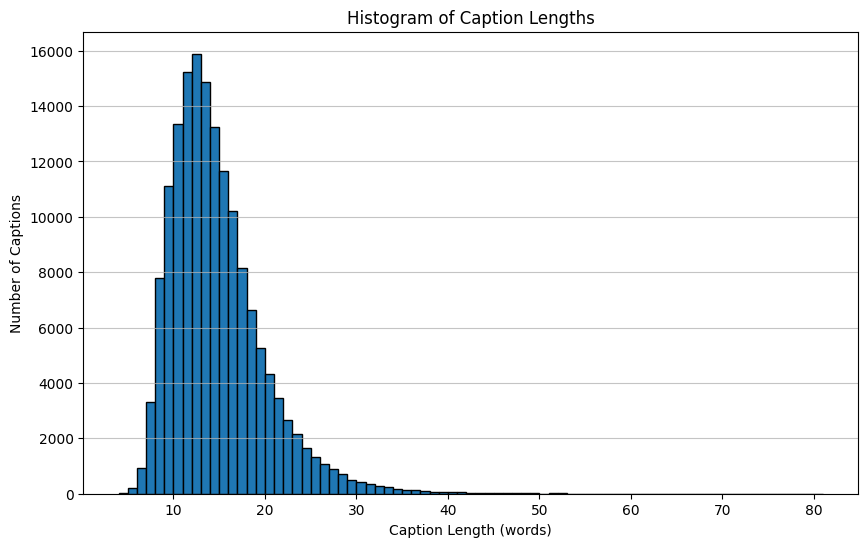

In [12]:
processor.plot_caption_length_histogram()

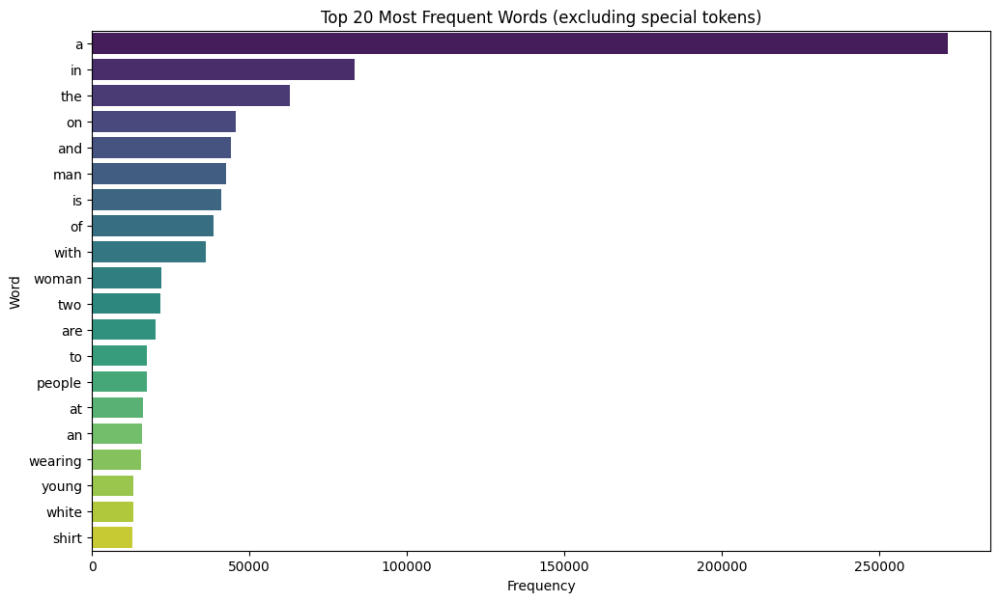

In [13]:
processor.plot_top_words(top_n=20)

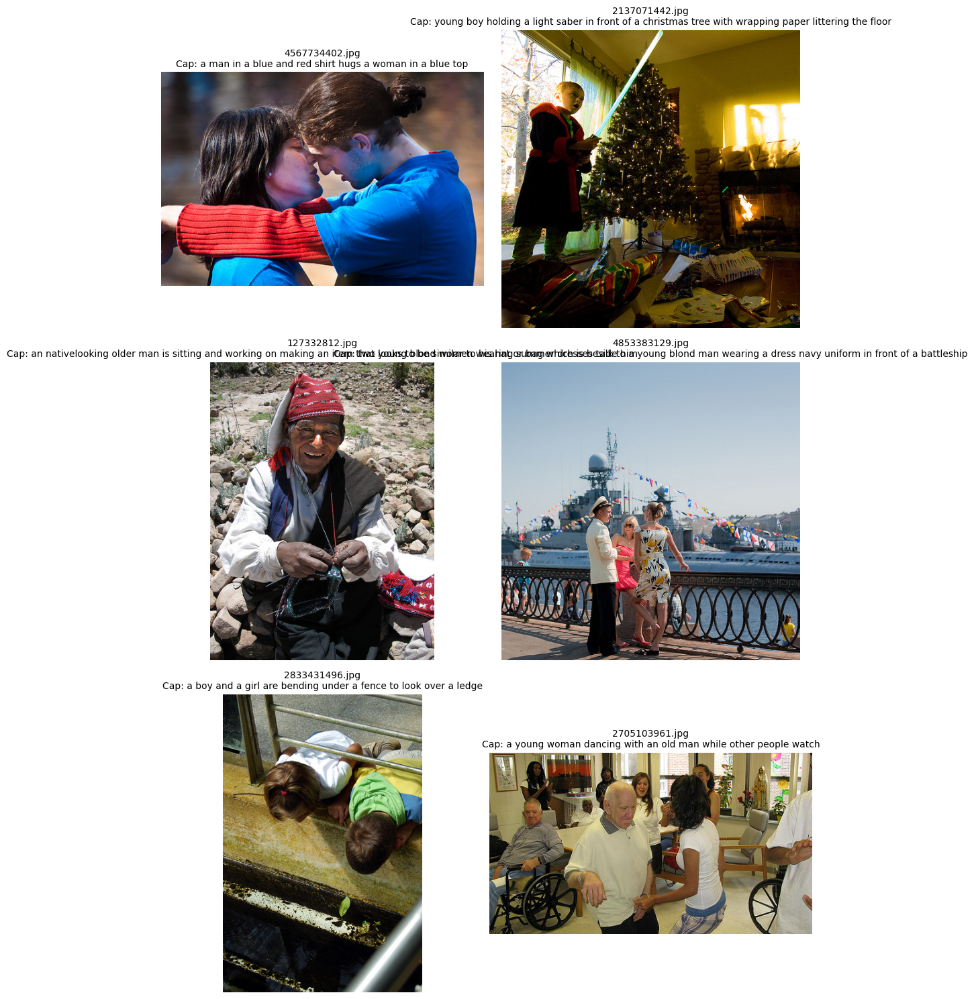

In [14]:
processor.plot_sample_images_with_caption(num_images=6)

#### Review of the built dataset


--- Displaying 2 Random Dataset Samples ---

--- Sample 1/2 ---
Image Name: 2609900643.jpg


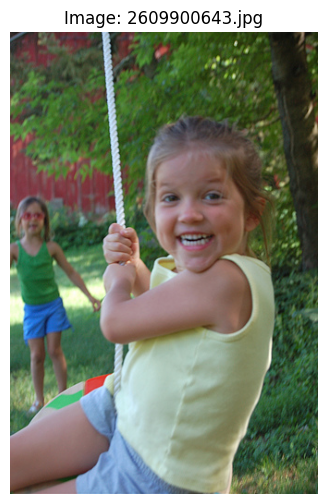

Ground Truth Captions:
  1. a little girl with a yellow shirt swings while a little girl in green watches
  2. a young girl wearing a yellow shirt swings on a tree rope
  3. a girl rides a swing while another girl watches
  4. the small girl is swinging on the rope
  5. a girl swings on a rope swing

--- Sample 2/2 ---
Image Name: 2276237758.jpg


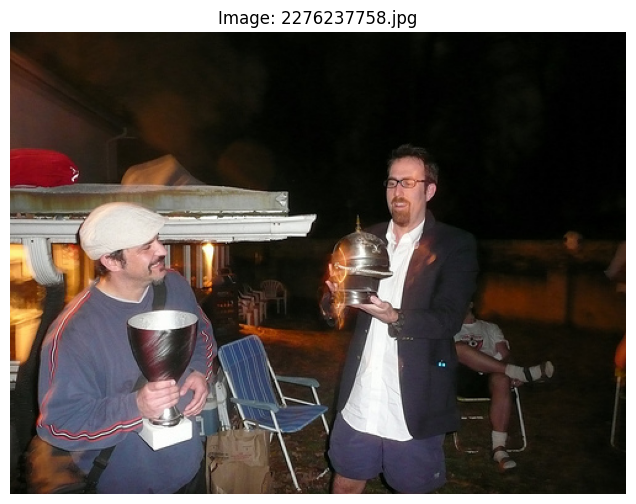

Ground Truth Captions:
  1. two men outside looking at metalwork objects
  2. two men enjoying drinks at an outdoor event
  3. two friends are comparing trophy s
  4. two men enjoy the weather outside
  5. two friends hold trophies


In [15]:
processor.display_samples(2)

#### Train, Val, Test split 

In [16]:
processor.create_dataset_splits(train_ratio=0.85, val_ratio=0.1)

Train images: 27015, Val images: 3178, Test images: 1590
Train pairs: 135074, Val pairs: 15890, Test pairs: 7950


#### Feature extractor

In [17]:
feature_extractor_model = ImageFeatureExtractor()

In [18]:
cache_manager = ImageFeatureCacheManager(CONFIG, feature_extractor_model)
image_name_to_cached_path_map = cache_manager.manage_feature_cache(processor.image_paths)
final_train_data, final_val_data, final_test_data = processor.get_data_with_cached_features(image_name_to_cached_path_map)


Managing image feature cache in: /home/flickr30k/cache
Checking/extracting features for 31783 unique images.
Found 31783 images whose features need extraction...


Extracting & Caching Features: 100%|██████████| 1987/1987 [09:46<00:00,  3.39it/s]


Image feature cache management complete.
Adjusted train pairs (after feature caching check): 135074
Adjusted val pairs (after feature caching check): 15890
Adjusted test pairs (after feature caching check): 7950


### CAPTIONING MODEL

In [19]:
trainer = ImageCaptioning(CONFIG, processor, feature_extractor_model)

Initializing from scratch.


In [20]:
trainer.summary()


--- Model Summaries ---

Encoder Model Summary:
Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               multiple                  196864    
                                                                 
Total params: 196,864
Trainable params: 196,864
Non-trainable params: 0
_________________________________________________________________

Decoder Model Summary:
Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       multiple                  1968640   
                                                                 
 lstm (LSTM)                 multiple                  2099200   
                                                                 
 dense_1 (Dense)             multiple                  262656    
                             

### MODEL TRAINING

In [21]:
trainer.train(final_train_data, processor.val_data)

Resuming training from epoch 1.
Targeting a total of 50 epochs.

Epoch 1/50 (Scheduled Sampling Prob: 0.000)
Global Step 100 Batch 99 Loss 0.9365
Global Step 200 Batch 199 Loss 0.9605
Global Step 300 Batch 299 Loss 0.9229
Global Step 400 Batch 399 Loss 0.8634
Global Step 500 Batch 499 Loss 0.8387
Global Step 600 Batch 599 Loss 0.8226
Global Step 700 Batch 699 Loss 0.8797
Global Step 800 Batch 799 Loss 0.8039
Global Step 900 Batch 899 Loss 0.7975
Global Step 1000 Batch 999 Loss 0.7897
Epoch 1 Loss 0.9009

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [01:35<00:00, 10.48it/s]


BLEU-1: 0.4814
BLEU-2: 0.2867
BLEU-3: 0.1674
BLEU-4: 0.1061
Training history and states saved.
Saving checkpoint at epoch 1 with BLEU-4: 0.1061
Time taken for 1 epoch: 539.57 secs

Epoch 2/50 (Scheduled Sampling Prob: 0.004)
Global Step 1100 Batch 43 Loss 0.8001
Global Step 1200 Batch 143 Loss 0.7674
Global Step 1300 Batch 243 Loss 0.7736
Global Step 1400 Batch 343 Loss 0.7845
Global Step 1500 Batch 443 Loss 0.7588
Global Step 1600 Batch 543 Loss 0.7558
Global Step 1700 Batch 643 Loss 0.6870
Global Step 1800 Batch 743 Loss 0.6745
Global Step 1900 Batch 843 Loss 0.7464
Global Step 2000 Batch 943 Loss 0.7089
Global Step 2100 Batch 1043 Loss 0.7059
Epoch 2 Loss 0.7453

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [12:24<00:00,  1.34it/s]


BLEU-1: 0.0832
BLEU-2: 0.0436
BLEU-3: 0.0232
BLEU-4: 0.0139
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 1181.42 secs

Epoch 3/50 (Scheduled Sampling Prob: 0.008)
Global Step 2200 Batch 87 Loss 0.6693
Global Step 2300 Batch 187 Loss 0.6824
Global Step 2400 Batch 287 Loss 0.6705
Global Step 2500 Batch 387 Loss 0.7005
Global Step 2600 Batch 487 Loss 0.6693
Global Step 2700 Batch 587 Loss 0.6774
Global Step 2800 Batch 687 Loss 0.7107
Global Step 2900 Batch 787 Loss 0.6781
Global Step 3000 Batch 887 Loss 0.7078
Global Step 3100 Batch 987 Loss 0.6383
Epoch 3 Loss 0.6884

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:17<00:00,  7.25it/s]


BLEU-1: 0.5148
BLEU-2: 0.3183
BLEU-3: 0.1770
BLEU-4: 0.1064
Training history and states saved.
Saving checkpoint at epoch 3 with BLEU-4: 0.1064
Time taken for 1 epoch: 573.43 secs

Epoch 4/50 (Scheduled Sampling Prob: 0.012)
Global Step 3200 Batch 31 Loss 0.6838
Global Step 3300 Batch 131 Loss 0.7163
Global Step 3400 Batch 231 Loss 0.6316
Global Step 3500 Batch 331 Loss 0.6273
Global Step 3600 Batch 431 Loss 0.6526
Global Step 3700 Batch 531 Loss 0.6983
Global Step 3800 Batch 631 Loss 0.6948
Global Step 3900 Batch 731 Loss 0.6742
Global Step 4000 Batch 831 Loss 0.6120
Global Step 4100 Batch 931 Loss 0.6466
Global Step 4200 Batch 1031 Loss 0.6530
Epoch 4 Loss 0.6571

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:41<00:00,  6.21it/s]


BLEU-1: 0.4306
BLEU-2: 0.2615
BLEU-3: 0.1503
BLEU-4: 0.0895
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 600.39 secs

Epoch 5/50 (Scheduled Sampling Prob: 0.016)
Global Step 4300 Batch 75 Loss 0.6284
Global Step 4400 Batch 175 Loss 0.6581
Global Step 4500 Batch 275 Loss 0.6115
Global Step 4600 Batch 375 Loss 0.6461
Global Step 4700 Batch 475 Loss 0.6477
Global Step 4800 Batch 575 Loss 0.5913
Global Step 4900 Batch 675 Loss 0.6544
Global Step 5000 Batch 775 Loss 0.6789
Global Step 5100 Batch 875 Loss 0.6173
Global Step 5200 Batch 975 Loss 0.6223
Epoch 5 Loss 0.6343

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:31<00:00,  6.62it/s]


BLEU-1: 0.4679
BLEU-2: 0.2959
BLEU-3: 0.1807
BLEU-4: 0.1144
Training history and states saved.
Saving checkpoint at epoch 5 with BLEU-4: 0.1144
Time taken for 1 epoch: 590.78 secs

Epoch 6/50 (Scheduled Sampling Prob: 0.020)
Global Step 5300 Batch 19 Loss 0.5974
Global Step 5400 Batch 119 Loss 0.6005
Global Step 5500 Batch 219 Loss 0.6942
Global Step 5600 Batch 319 Loss 0.6639
Global Step 5700 Batch 419 Loss 0.5469
Global Step 5800 Batch 519 Loss 0.6003
Global Step 5900 Batch 619 Loss 0.6604
Global Step 6000 Batch 719 Loss 0.5740
Global Step 6100 Batch 819 Loss 0.5893
Global Step 6200 Batch 919 Loss 0.6667
Global Step 6300 Batch 1019 Loss 0.5864
Epoch 6 Loss 0.6156

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:40<00:00,  6.24it/s]


BLEU-1: 0.4177
BLEU-2: 0.2649
BLEU-3: 0.1619
BLEU-4: 0.1021
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 597.71 secs

Epoch 7/50 (Scheduled Sampling Prob: 0.024)
Global Step 6400 Batch 63 Loss 0.5807
Global Step 6500 Batch 163 Loss 0.6414
Global Step 6600 Batch 263 Loss 0.6280
Global Step 6700 Batch 363 Loss 0.6232
Global Step 6800 Batch 463 Loss 0.5681
Global Step 6900 Batch 563 Loss 0.5957
Global Step 7000 Batch 663 Loss 0.6545
Global Step 7100 Batch 763 Loss 0.6236
Global Step 7200 Batch 863 Loss 0.5697
Global Step 7300 Batch 963 Loss 0.5654
Epoch 7 Loss 0.6005

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:47<00:00,  5.98it/s]


BLEU-1: 0.4207
BLEU-2: 0.2717
BLEU-3: 0.1687
BLEU-4: 0.1057
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 603.60 secs

Epoch 8/50 (Scheduled Sampling Prob: 0.029)
Global Step 7400 Batch 7 Loss 0.5844
Global Step 7500 Batch 107 Loss 0.6261
Global Step 7600 Batch 207 Loss 0.6068
Global Step 7700 Batch 307 Loss 0.5823
Global Step 7800 Batch 407 Loss 0.5835
Global Step 7900 Batch 507 Loss 0.6218
Global Step 8000 Batch 607 Loss 0.5991
Global Step 8100 Batch 707 Loss 0.5681
Global Step 8200 Batch 807 Loss 0.6191
Global Step 8300 Batch 907 Loss 0.5363
Global Step 8400 Batch 1007 Loss 0.5352
Epoch 8 Loss 0.5882

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:32<00:00,  6.57it/s]


BLEU-1: 0.4784
BLEU-2: 0.3090
BLEU-3: 0.1904
BLEU-4: 0.1193
Training history and states saved.
Saving checkpoint at epoch 8 with BLEU-4: 0.1193
Time taken for 1 epoch: 589.52 secs

Epoch 9/50 (Scheduled Sampling Prob: 0.033)
Global Step 8500 Batch 51 Loss 0.6028
Global Step 8600 Batch 151 Loss 0.5742
Global Step 8700 Batch 251 Loss 0.5763
Global Step 8800 Batch 351 Loss 0.5692
Global Step 8900 Batch 451 Loss 0.5654
Global Step 9000 Batch 551 Loss 0.6115
Global Step 9100 Batch 651 Loss 0.6172
Global Step 9200 Batch 751 Loss 0.5570
Global Step 9300 Batch 851 Loss 0.5765
Global Step 9400 Batch 951 Loss 0.6075
Global Step 9500 Batch 1051 Loss 0.5845
Epoch 9 Loss 0.5778

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:33<00:00,  6.53it/s]


BLEU-1: 0.4797
BLEU-2: 0.3086
BLEU-3: 0.1903
BLEU-4: 0.1191
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 589.98 secs

Epoch 10/50 (Scheduled Sampling Prob: 0.037)
Global Step 9600 Batch 95 Loss 0.5783
Global Step 9700 Batch 195 Loss 0.5692
Global Step 9800 Batch 295 Loss 0.5624
Global Step 9900 Batch 395 Loss 0.5368
Global Step 10000 Batch 495 Loss 0.5166
Global Step 10100 Batch 595 Loss 0.5580
Global Step 10200 Batch 695 Loss 0.5655
Global Step 10300 Batch 795 Loss 0.5545
Global Step 10400 Batch 895 Loss 0.5656
Global Step 10500 Batch 995 Loss 0.5690
Epoch 10 Loss 0.5687

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:36<00:00,  6.40it/s]


BLEU-1: 0.4637
BLEU-2: 0.2989
BLEU-3: 0.1837
BLEU-4: 0.1143
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 588.23 secs

Epoch 11/50 (Scheduled Sampling Prob: 0.041)
Global Step 10600 Batch 39 Loss 0.5861
Global Step 10700 Batch 139 Loss 0.5566
Global Step 10800 Batch 239 Loss 0.5637
Global Step 10900 Batch 339 Loss 0.5310
Global Step 11000 Batch 439 Loss 0.5403
Global Step 11100 Batch 539 Loss 0.5681
Global Step 11200 Batch 639 Loss 0.6115
Global Step 11300 Batch 739 Loss 0.5823
Global Step 11400 Batch 839 Loss 0.5532
Global Step 11500 Batch 939 Loss 0.5691
Global Step 11600 Batch 1039 Loss 0.5365
Epoch 11 Loss 0.5607

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:33<00:00,  6.50it/s]


BLEU-1: 0.4788
BLEU-2: 0.3118
BLEU-3: 0.1916
BLEU-4: 0.1210
Training history and states saved.
Saving checkpoint at epoch 11 with BLEU-4: 0.1210
Time taken for 1 epoch: 586.80 secs

Epoch 12/50 (Scheduled Sampling Prob: 0.045)
Global Step 11700 Batch 83 Loss 0.5536
Global Step 11800 Batch 183 Loss 0.5780
Global Step 11900 Batch 283 Loss 0.5465
Global Step 12000 Batch 383 Loss 0.5607
Global Step 12100 Batch 483 Loss 0.5162
Global Step 12200 Batch 583 Loss 0.5052
Global Step 12300 Batch 683 Loss 0.5618
Global Step 12400 Batch 783 Loss 0.5319
Global Step 12500 Batch 883 Loss 0.5489
Global Step 12600 Batch 983 Loss 0.5671
Epoch 12 Loss 0.5534

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:53<00:00,  5.76it/s]


BLEU-1: 0.4298
BLEU-2: 0.2852
BLEU-3: 0.1817
BLEU-4: 0.1175
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 606.90 secs

Epoch 13/50 (Scheduled Sampling Prob: 0.049)
Global Step 12700 Batch 27 Loss 0.5142
Global Step 12800 Batch 127 Loss 0.5575
Global Step 12900 Batch 227 Loss 0.5399
Global Step 13000 Batch 327 Loss 0.5132
Global Step 13100 Batch 427 Loss 0.5456
Global Step 13200 Batch 527 Loss 0.5386
Global Step 13300 Batch 627 Loss 0.5522
Global Step 13400 Batch 727 Loss 0.5306
Global Step 13500 Batch 827 Loss 0.4913
Global Step 13600 Batch 927 Loss 0.5421
Global Step 13700 Batch 1027 Loss 0.5491
Epoch 13 Loss 0.5467

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:45<00:00,  6.03it/s]


BLEU-1: 0.4532
BLEU-2: 0.2971
BLEU-3: 0.1866
BLEU-4: 0.1195
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 599.09 secs

Epoch 14/50 (Scheduled Sampling Prob: 0.053)
Global Step 13800 Batch 71 Loss 0.5476
Global Step 13900 Batch 171 Loss 0.5164
Global Step 14000 Batch 271 Loss 0.5631
Global Step 14100 Batch 371 Loss 0.5384
Global Step 14200 Batch 471 Loss 0.5609
Global Step 14300 Batch 571 Loss 0.5620
Global Step 14400 Batch 671 Loss 0.6056
Global Step 14500 Batch 771 Loss 0.5707
Global Step 14600 Batch 871 Loss 0.5446
Global Step 14700 Batch 971 Loss 0.5455
Epoch 14 Loss 0.5406

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:32<00:00,  6.55it/s]


BLEU-1: 0.4814
BLEU-2: 0.3149
BLEU-3: 0.2029
BLEU-4: 0.1330
Training history and states saved.
Saving checkpoint at epoch 14 with BLEU-4: 0.1330
Time taken for 1 epoch: 588.10 secs

Epoch 15/50 (Scheduled Sampling Prob: 0.057)
Global Step 14800 Batch 15 Loss 0.5244
Global Step 14900 Batch 115 Loss 0.5280
Global Step 15000 Batch 215 Loss 0.4958
Global Step 15100 Batch 315 Loss 0.4960
Global Step 15200 Batch 415 Loss 0.4884
Global Step 15300 Batch 515 Loss 0.5342
Global Step 15400 Batch 615 Loss 0.5399
Global Step 15500 Batch 715 Loss 0.5169
Global Step 15600 Batch 815 Loss 0.4851
Global Step 15700 Batch 915 Loss 0.5520
Global Step 15800 Batch 1015 Loss 0.5898
Epoch 15 Loss 0.5349

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:28<00:00,  6.73it/s]


BLEU-1: 0.4894
BLEU-2: 0.3215
BLEU-3: 0.2064
BLEU-4: 0.1337
Training history and states saved.
Saving checkpoint at epoch 15 with BLEU-4: 0.1337
Time taken for 1 epoch: 585.80 secs

Epoch 16/50 (Scheduled Sampling Prob: 0.061)
Global Step 15900 Batch 59 Loss 0.5060
Global Step 16000 Batch 159 Loss 0.5606
Global Step 16100 Batch 259 Loss 0.5564
Global Step 16200 Batch 359 Loss 0.5916
Global Step 16300 Batch 459 Loss 0.6027
Global Step 16400 Batch 559 Loss 0.5069
Global Step 16500 Batch 659 Loss 0.5338
Global Step 16600 Batch 759 Loss 0.5588
Global Step 16700 Batch 859 Loss 0.5561
Global Step 16800 Batch 959 Loss 0.5297
Epoch 16 Loss 0.5296

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:49<00:00,  5.90it/s]


BLEU-1: 0.4399
BLEU-2: 0.2940
BLEU-3: 0.1915
BLEU-4: 0.1269
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 604.35 secs

Epoch 17/50 (Scheduled Sampling Prob: 0.065)
Global Step 16900 Batch 3 Loss 0.5297
Global Step 17000 Batch 103 Loss 0.4994
Global Step 17100 Batch 203 Loss 0.5054
Global Step 17200 Batch 303 Loss 0.5494
Global Step 17300 Batch 403 Loss 0.5061
Global Step 17400 Batch 503 Loss 0.5110
Global Step 17500 Batch 603 Loss 0.5288
Global Step 17600 Batch 703 Loss 0.5599
Global Step 17700 Batch 803 Loss 0.5562
Global Step 17800 Batch 903 Loss 0.5300
Global Step 17900 Batch 1003 Loss 0.5119
Epoch 17 Loss 0.5245

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:36<00:00,  6.41it/s]


BLEU-1: 0.4780
BLEU-2: 0.3210
BLEU-3: 0.2096
BLEU-4: 0.1390
Training history and states saved.
Saving checkpoint at epoch 17 with BLEU-4: 0.1390
Time taken for 1 epoch: 583.20 secs

Epoch 18/50 (Scheduled Sampling Prob: 0.069)
Global Step 18000 Batch 47 Loss 0.5157
Global Step 18100 Batch 147 Loss 0.4949
Global Step 18200 Batch 247 Loss 0.5319
Global Step 18300 Batch 347 Loss 0.5030
Global Step 18400 Batch 447 Loss 0.4878
Global Step 18500 Batch 547 Loss 0.4835
Global Step 18600 Batch 647 Loss 0.5200
Global Step 18700 Batch 747 Loss 0.5343
Global Step 18800 Batch 847 Loss 0.5157
Global Step 18900 Batch 947 Loss 0.5120
Global Step 19000 Batch 1047 Loss 0.5073
Epoch 18 Loss 0.5198

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:38<00:00,  6.31it/s]


BLEU-1: 0.4725
BLEU-2: 0.3169
BLEU-3: 0.2068
BLEU-4: 0.1360
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 543.04 secs

Epoch 19/50 (Scheduled Sampling Prob: 0.073)
Global Step 19100 Batch 91 Loss 0.4774
Global Step 19200 Batch 191 Loss 0.5456
Global Step 19300 Batch 291 Loss 0.5519
Global Step 19400 Batch 391 Loss 0.5085
Global Step 19500 Batch 491 Loss 0.5070
Global Step 19600 Batch 591 Loss 0.4916
Global Step 19700 Batch 691 Loss 0.4760
Global Step 19800 Batch 791 Loss 0.5068
Global Step 19900 Batch 891 Loss 0.5328
Global Step 20000 Batch 991 Loss 0.5148
Epoch 19 Loss 0.5154

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:31<00:00,  6.61it/s]


BLEU-1: 0.4949
BLEU-2: 0.3287
BLEU-3: 0.2096
BLEU-4: 0.1351
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 538.61 secs

Epoch 20/50 (Scheduled Sampling Prob: 0.078)
Global Step 20100 Batch 35 Loss 0.4966
Global Step 20200 Batch 135 Loss 0.5388
Global Step 20300 Batch 235 Loss 0.5429
Global Step 20400 Batch 335 Loss 0.5159
Global Step 20500 Batch 435 Loss 0.5256
Global Step 20600 Batch 535 Loss 0.4841
Global Step 20700 Batch 635 Loss 0.4933
Global Step 20800 Batch 735 Loss 0.5159
Global Step 20900 Batch 835 Loss 0.4805
Global Step 21000 Batch 935 Loss 0.5066
Global Step 21100 Batch 1035 Loss 0.4993
Epoch 20 Loss 0.5111

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:26<00:00,  6.83it/s]


BLEU-1: 0.5381
BLEU-2: 0.3608
BLEU-3: 0.2347
BLEU-4: 0.1551
Training history and states saved.
Saving checkpoint at epoch 20 with BLEU-4: 0.1551
Time taken for 1 epoch: 530.68 secs

Epoch 21/50 (Scheduled Sampling Prob: 0.082)
Global Step 21200 Batch 79 Loss 0.5083
Global Step 21300 Batch 179 Loss 0.5372
Global Step 21400 Batch 279 Loss 0.4959
Global Step 21500 Batch 379 Loss 0.5104
Global Step 21600 Batch 479 Loss 0.5161
Global Step 21700 Batch 579 Loss 0.4903
Global Step 21800 Batch 679 Loss 0.5537
Global Step 21900 Batch 779 Loss 0.5004
Global Step 22000 Batch 879 Loss 0.5030
Global Step 22100 Batch 979 Loss 0.4879
Epoch 21 Loss 0.5071

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:20<00:00,  7.10it/s]


BLEU-1: 0.5491
BLEU-2: 0.3720
BLEU-3: 0.2440
BLEU-4: 0.1634
Training history and states saved.
Saving checkpoint at epoch 21 with BLEU-4: 0.1634
Time taken for 1 epoch: 526.97 secs

Epoch 22/50 (Scheduled Sampling Prob: 0.086)
Global Step 22200 Batch 23 Loss 0.5406
Global Step 22300 Batch 123 Loss 0.5027
Global Step 22400 Batch 223 Loss 0.5233
Global Step 22500 Batch 323 Loss 0.5281
Global Step 22600 Batch 423 Loss 0.5352
Global Step 22700 Batch 523 Loss 0.4905
Global Step 22800 Batch 623 Loss 0.5057
Global Step 22900 Batch 723 Loss 0.4760
Global Step 23000 Batch 823 Loss 0.4844
Global Step 23100 Batch 923 Loss 0.4989
Global Step 23200 Batch 1023 Loss 0.4769
Epoch 22 Loss 0.5033

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:18<00:00,  7.20it/s]


BLEU-1: 0.5549
BLEU-2: 0.3754
BLEU-3: 0.2486
BLEU-4: 0.1647
Training history and states saved.
Saving checkpoint at epoch 22 with BLEU-4: 0.1647
Time taken for 1 epoch: 526.30 secs

Epoch 23/50 (Scheduled Sampling Prob: 0.090)
Global Step 23300 Batch 67 Loss 0.4943
Global Step 23400 Batch 167 Loss 0.5025
Global Step 23500 Batch 267 Loss 0.5350
Global Step 23600 Batch 367 Loss 0.5380
Global Step 23700 Batch 467 Loss 0.4832
Global Step 23800 Batch 567 Loss 0.5222
Global Step 23900 Batch 667 Loss 0.5218
Global Step 24000 Batch 767 Loss 0.5094
Global Step 24100 Batch 867 Loss 0.5250
Global Step 24200 Batch 967 Loss 0.5021
Epoch 23 Loss 0.4996

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:23<00:00,  6.99it/s]


BLEU-1: 0.5355
BLEU-2: 0.3639
BLEU-3: 0.2403
BLEU-4: 0.1599
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 531.73 secs

Epoch 24/50 (Scheduled Sampling Prob: 0.094)
Global Step 24300 Batch 11 Loss 0.4980
Global Step 24400 Batch 111 Loss 0.4892
Global Step 24500 Batch 211 Loss 0.5137
Global Step 24600 Batch 311 Loss 0.4967
Global Step 24700 Batch 411 Loss 0.5302
Global Step 24800 Batch 511 Loss 0.4885
Global Step 24900 Batch 611 Loss 0.4485
Global Step 25000 Batch 711 Loss 0.4701
Global Step 25100 Batch 811 Loss 0.4917
Global Step 25200 Batch 911 Loss 0.4940
Global Step 25300 Batch 1011 Loss 0.4801
Epoch 24 Loss 0.4961

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:18<00:00,  7.24it/s]


BLEU-1: 0.5557
BLEU-2: 0.3813
BLEU-3: 0.2539
BLEU-4: 0.1698
Training history and states saved.
Saving checkpoint at epoch 24 with BLEU-4: 0.1698
Time taken for 1 epoch: 523.96 secs

Epoch 25/50 (Scheduled Sampling Prob: 0.098)
Global Step 25400 Batch 55 Loss 0.4379
Global Step 25500 Batch 155 Loss 0.4749
Global Step 25600 Batch 255 Loss 0.4947
Global Step 25700 Batch 355 Loss 0.4925
Global Step 25800 Batch 455 Loss 0.4902
Global Step 25900 Batch 555 Loss 0.5153
Global Step 26000 Batch 655 Loss 0.4767
Global Step 26100 Batch 755 Loss 0.4776
Global Step 26200 Batch 855 Loss 0.4738
Global Step 26300 Batch 955 Loss 0.5110
Global Step 26400 Batch 1055 Loss 0.5344
Epoch 25 Loss 0.4928

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:23<00:00,  6.99it/s]


BLEU-1: 0.5416
BLEU-2: 0.3646
BLEU-3: 0.2430
BLEU-4: 0.1630
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 528.74 secs

Epoch 26/50 (Scheduled Sampling Prob: 0.102)
Global Step 26500 Batch 99 Loss 0.4807
Global Step 26600 Batch 199 Loss 0.4815
Global Step 26700 Batch 299 Loss 0.5261
Global Step 26800 Batch 399 Loss 0.4759
Global Step 26900 Batch 499 Loss 0.5071
Global Step 27000 Batch 599 Loss 0.4871
Global Step 27100 Batch 699 Loss 0.5060
Global Step 27200 Batch 799 Loss 0.5063
Global Step 27300 Batch 899 Loss 0.5132
Global Step 27400 Batch 999 Loss 0.4656
Epoch 26 Loss 0.4895

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:18<00:00,  7.24it/s]


BLEU-1: 0.5643
BLEU-2: 0.3832
BLEU-3: 0.2542
BLEU-4: 0.1717
Training history and states saved.
Saving checkpoint at epoch 26 with BLEU-4: 0.1717
Time taken for 1 epoch: 521.96 secs

Epoch 27/50 (Scheduled Sampling Prob: 0.106)
Global Step 27500 Batch 43 Loss 0.4805
Global Step 27600 Batch 143 Loss 0.4726
Global Step 27700 Batch 243 Loss 0.4791
Global Step 27800 Batch 343 Loss 0.4521
Global Step 27900 Batch 443 Loss 0.4512
Global Step 28000 Batch 543 Loss 0.4798
Global Step 28100 Batch 643 Loss 0.4666
Global Step 28200 Batch 743 Loss 0.4858
Global Step 28300 Batch 843 Loss 0.4895
Global Step 28400 Batch 943 Loss 0.5013
Global Step 28500 Batch 1043 Loss 0.5059
Epoch 27 Loss 0.4864

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:17<00:00,  7.26it/s]


BLEU-1: 0.5544
BLEU-2: 0.3765
BLEU-3: 0.2488
BLEU-4: 0.1655
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 526.56 secs

Epoch 28/50 (Scheduled Sampling Prob: 0.110)
Global Step 28600 Batch 87 Loss 0.4744
Global Step 28700 Batch 187 Loss 0.4629
Global Step 28800 Batch 287 Loss 0.4797
Global Step 28900 Batch 387 Loss 0.4895
Global Step 29000 Batch 487 Loss 0.4523
Global Step 29100 Batch 587 Loss 0.4951
Global Step 29200 Batch 687 Loss 0.4619
Global Step 29300 Batch 787 Loss 0.4683
Global Step 29400 Batch 887 Loss 0.4585
Global Step 29500 Batch 987 Loss 0.4520
Epoch 28 Loss 0.4834

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:20<00:00,  7.13it/s]


BLEU-1: 0.5589
BLEU-2: 0.3800
BLEU-3: 0.2558
BLEU-4: 0.1733
Training history and states saved.
Saving checkpoint at epoch 28 with BLEU-4: 0.1733
Time taken for 1 epoch: 525.91 secs

Epoch 29/50 (Scheduled Sampling Prob: 0.114)
Global Step 29600 Batch 31 Loss 0.4875
Global Step 29700 Batch 131 Loss 0.4797
Global Step 29800 Batch 231 Loss 0.5124
Global Step 29900 Batch 331 Loss 0.4692
Global Step 30000 Batch 431 Loss 0.5009
Global Step 30100 Batch 531 Loss 0.4660
Global Step 30200 Batch 631 Loss 0.4762
Global Step 30300 Batch 731 Loss 0.4696
Global Step 30400 Batch 831 Loss 0.4595
Global Step 30500 Batch 931 Loss 0.4785
Global Step 30600 Batch 1031 Loss 0.4804
Epoch 29 Loss 0.4806

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:14<00:00,  7.41it/s]


BLEU-1: 0.5701
BLEU-2: 0.3897
BLEU-3: 0.2624
BLEU-4: 0.1780
Training history and states saved.
Saving checkpoint at epoch 29 with BLEU-4: 0.1780
Time taken for 1 epoch: 520.83 secs

Epoch 30/50 (Scheduled Sampling Prob: 0.118)
Global Step 30700 Batch 75 Loss 0.4811
Global Step 30800 Batch 175 Loss 0.4685
Global Step 30900 Batch 275 Loss 0.5165
Global Step 31000 Batch 375 Loss 0.4940
Global Step 31100 Batch 475 Loss 0.4761
Global Step 31200 Batch 575 Loss 0.4945
Global Step 31300 Batch 675 Loss 0.4630
Global Step 31400 Batch 775 Loss 0.4996
Global Step 31500 Batch 875 Loss 0.4325
Global Step 31600 Batch 975 Loss 0.4731
Epoch 30 Loss 0.4777

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:15<00:00,  7.37it/s]


BLEU-1: 0.5631
BLEU-2: 0.3826
BLEU-3: 0.2526
BLEU-4: 0.1696
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 520.66 secs

Epoch 31/50 (Scheduled Sampling Prob: 0.122)
Global Step 31700 Batch 19 Loss 0.4735
Global Step 31800 Batch 119 Loss 0.5132
Global Step 31900 Batch 219 Loss 0.4737
Global Step 32000 Batch 319 Loss 0.5161
Global Step 32100 Batch 419 Loss 0.4769
Global Step 32200 Batch 519 Loss 0.4515
Global Step 32300 Batch 619 Loss 0.5089
Global Step 32400 Batch 719 Loss 0.4540
Global Step 32500 Batch 819 Loss 0.4476
Global Step 32600 Batch 919 Loss 0.4849
Global Step 32700 Batch 1019 Loss 0.4993
Epoch 31 Loss 0.4750

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:13<00:00,  7.47it/s]


BLEU-1: 0.5769
BLEU-2: 0.3914
BLEU-3: 0.2606
BLEU-4: 0.1743
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 516.99 secs

Epoch 32/50 (Scheduled Sampling Prob: 0.127)
Global Step 32800 Batch 63 Loss 0.4784
Global Step 32900 Batch 163 Loss 0.4811
Global Step 33000 Batch 263 Loss 0.4581
Global Step 33100 Batch 363 Loss 0.4531
Global Step 33200 Batch 463 Loss 0.4480
Global Step 33300 Batch 563 Loss 0.4349
Global Step 33400 Batch 663 Loss 0.4784
Global Step 33500 Batch 763 Loss 0.4679
Global Step 33600 Batch 863 Loss 0.4299
Global Step 33700 Batch 963 Loss 0.4804
Epoch 32 Loss 0.4724

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:06<00:00,  7.93it/s]


BLEU-1: 0.5955
BLEU-2: 0.4060
BLEU-3: 0.2704
BLEU-4: 0.1812
Training history and states saved.
Saving checkpoint at epoch 32 with BLEU-4: 0.1812
Time taken for 1 epoch: 527.76 secs

Epoch 33/50 (Scheduled Sampling Prob: 0.131)
Global Step 33800 Batch 7 Loss 0.4925
Global Step 33900 Batch 107 Loss 0.4483
Global Step 34000 Batch 207 Loss 0.4835
Global Step 34100 Batch 307 Loss 0.4499
Global Step 34200 Batch 407 Loss 0.4904
Global Step 34300 Batch 507 Loss 0.4716
Global Step 34400 Batch 607 Loss 0.4579
Global Step 34500 Batch 707 Loss 0.5137
Global Step 34600 Batch 807 Loss 0.4960
Global Step 34700 Batch 907 Loss 0.4784
Global Step 34800 Batch 1007 Loss 0.4123
Epoch 33 Loss 0.4699

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:19<00:00,  7.19it/s]


BLEU-1: 0.5598
BLEU-2: 0.3734
BLEU-3: 0.2463
BLEU-4: 0.1648
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 571.40 secs

Epoch 34/50 (Scheduled Sampling Prob: 0.135)
Global Step 34900 Batch 51 Loss 0.4406
Global Step 35000 Batch 151 Loss 0.4761
Global Step 35100 Batch 251 Loss 0.4744
Global Step 35200 Batch 351 Loss 0.4127
Global Step 35300 Batch 451 Loss 0.4633
Global Step 35400 Batch 551 Loss 0.4520
Global Step 35500 Batch 651 Loss 0.4828
Global Step 35600 Batch 751 Loss 0.4511
Global Step 35700 Batch 851 Loss 0.4909
Global Step 35800 Batch 951 Loss 0.4751
Global Step 35900 Batch 1051 Loss 0.4661
Epoch 34 Loss 0.4674

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:12<00:00,  7.54it/s]


BLEU-1: 0.5790
BLEU-2: 0.4000
BLEU-3: 0.2717
BLEU-4: 0.1865
Training history and states saved.
Saving checkpoint at epoch 34 with BLEU-4: 0.1865
Time taken for 1 epoch: 567.01 secs

Epoch 35/50 (Scheduled Sampling Prob: 0.139)
Global Step 36000 Batch 95 Loss 0.5143
Global Step 36100 Batch 195 Loss 0.4615
Global Step 36200 Batch 295 Loss 0.4896
Global Step 36300 Batch 395 Loss 0.4409
Global Step 36400 Batch 495 Loss 0.4520
Global Step 36500 Batch 595 Loss 0.4802
Global Step 36600 Batch 695 Loss 0.4387
Global Step 36700 Batch 795 Loss 0.4689
Global Step 36800 Batch 895 Loss 0.4728
Global Step 36900 Batch 995 Loss 0.4164
Epoch 35 Loss 0.4649

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:12<00:00,  7.54it/s]


BLEU-1: 0.5745
BLEU-2: 0.3939
BLEU-3: 0.2664
BLEU-4: 0.1828
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 565.05 secs

Epoch 36/50 (Scheduled Sampling Prob: 0.143)
Global Step 37000 Batch 39 Loss 0.4642
Global Step 37100 Batch 139 Loss 0.4584
Global Step 37200 Batch 239 Loss 0.4724
Global Step 37300 Batch 339 Loss 0.4314
Global Step 37400 Batch 439 Loss 0.4658
Global Step 37500 Batch 539 Loss 0.4669
Global Step 37600 Batch 639 Loss 0.4883
Global Step 37700 Batch 739 Loss 0.4735
Global Step 37800 Batch 839 Loss 0.4306
Global Step 37900 Batch 939 Loss 0.4699
Global Step 38000 Batch 1039 Loss 0.4365
Epoch 36 Loss 0.4626

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:16<00:00,  7.32it/s]


BLEU-1: 0.5716
BLEU-2: 0.3889
BLEU-3: 0.2584
BLEU-4: 0.1744
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 573.21 secs

Epoch 37/50 (Scheduled Sampling Prob: 0.147)
Global Step 38100 Batch 83 Loss 0.4383
Global Step 38200 Batch 183 Loss 0.4335
Global Step 38300 Batch 283 Loss 0.4765
Global Step 38400 Batch 383 Loss 0.4564
Global Step 38500 Batch 483 Loss 0.4692
Global Step 38600 Batch 583 Loss 0.4466
Global Step 38700 Batch 683 Loss 0.4615
Global Step 38800 Batch 783 Loss 0.4862
Global Step 38900 Batch 883 Loss 0.4359
Global Step 39000 Batch 983 Loss 0.5018
Epoch 37 Loss 0.4602

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:13<00:00,  7.49it/s]


BLEU-1: 0.5846
BLEU-2: 0.3975
BLEU-3: 0.2674
BLEU-4: 0.1806
BLEU-4 not improved. Patience counter: 3/8
Time taken for 1 epoch: 566.42 secs

Epoch 38/50 (Scheduled Sampling Prob: 0.151)
Global Step 39100 Batch 27 Loss 0.4641
Global Step 39200 Batch 127 Loss 0.4492
Global Step 39300 Batch 227 Loss 0.4494
Global Step 39400 Batch 327 Loss 0.4568
Global Step 39500 Batch 427 Loss 0.5003
Global Step 39600 Batch 527 Loss 0.4541
Global Step 39700 Batch 627 Loss 0.4466
Global Step 39800 Batch 727 Loss 0.4702
Global Step 39900 Batch 827 Loss 0.4548
Global Step 40000 Batch 927 Loss 0.4553
Global Step 40100 Batch 1027 Loss 0.4726
Epoch 38 Loss 0.4580

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:12<00:00,  7.53it/s]


BLEU-1: 0.5923
BLEU-2: 0.4072
BLEU-3: 0.2738
BLEU-4: 0.1849
BLEU-4 not improved. Patience counter: 4/8
Time taken for 1 epoch: 566.74 secs

Epoch 39/50 (Scheduled Sampling Prob: 0.155)
Global Step 40200 Batch 71 Loss 0.4409
Global Step 40300 Batch 171 Loss 0.4712
Global Step 40400 Batch 271 Loss 0.4419
Global Step 40500 Batch 371 Loss 0.4342
Global Step 40600 Batch 471 Loss 0.4111
Global Step 40700 Batch 571 Loss 0.4331
Global Step 40800 Batch 671 Loss 0.4545
Global Step 40900 Batch 771 Loss 0.4424
Global Step 41000 Batch 871 Loss 0.4636
Global Step 41100 Batch 971 Loss 0.4528
Epoch 39 Loss 0.4558

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:18<00:00,  7.22it/s]


BLEU-1: 0.5860
BLEU-2: 0.4040
BLEU-3: 0.2746
BLEU-4: 0.1871
Training history and states saved.
Saving checkpoint at epoch 39 with BLEU-4: 0.1871
Time taken for 1 epoch: 572.39 secs

Epoch 40/50 (Scheduled Sampling Prob: 0.159)
Global Step 41200 Batch 15 Loss 0.4708
Global Step 41300 Batch 115 Loss 0.4389
Global Step 41400 Batch 215 Loss 0.4977
Global Step 41500 Batch 315 Loss 0.4425
Global Step 41600 Batch 415 Loss 0.4418
Global Step 41700 Batch 515 Loss 0.4219
Global Step 41800 Batch 615 Loss 0.4677
Global Step 41900 Batch 715 Loss 0.4225
Global Step 42000 Batch 815 Loss 0.4136
Global Step 42100 Batch 915 Loss 0.4220
Global Step 42200 Batch 1015 Loss 0.4695
Epoch 40 Loss 0.4536

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:15<00:00,  7.38it/s]


BLEU-1: 0.5635
BLEU-2: 0.3844
BLEU-3: 0.2584
BLEU-4: 0.1750
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 566.47 secs

Epoch 41/50 (Scheduled Sampling Prob: 0.163)
Global Step 42300 Batch 59 Loss 0.4326
Global Step 42400 Batch 159 Loss 0.4893
Global Step 42500 Batch 259 Loss 0.4407
Global Step 42600 Batch 359 Loss 0.4322
Global Step 42700 Batch 459 Loss 0.4735
Global Step 42800 Batch 559 Loss 0.4736
Global Step 42900 Batch 659 Loss 0.4358
Global Step 43000 Batch 759 Loss 0.4622
Global Step 43100 Batch 859 Loss 0.4406
Global Step 43200 Batch 959 Loss 0.4395
Epoch 41 Loss 0.4514

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:12<00:00,  7.55it/s]


BLEU-1: 0.5803
BLEU-2: 0.3961
BLEU-3: 0.2648
BLEU-4: 0.1783
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 569.07 secs

Epoch 42/50 (Scheduled Sampling Prob: 0.167)
Global Step 43300 Batch 3 Loss 0.4120
Global Step 43400 Batch 103 Loss 0.4862
Global Step 43500 Batch 203 Loss 0.4754
Global Step 43600 Batch 303 Loss 0.4657
Global Step 43700 Batch 403 Loss 0.4519
Global Step 43800 Batch 503 Loss 0.3913
Global Step 43900 Batch 603 Loss 0.4141
Global Step 44000 Batch 703 Loss 0.4041
Global Step 44100 Batch 803 Loss 0.4286
Global Step 44200 Batch 903 Loss 0.4556
Global Step 44300 Batch 1003 Loss 0.4552
Epoch 42 Loss 0.4493

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:13<00:00,  7.50it/s]


BLEU-1: 0.5990
BLEU-2: 0.4131
BLEU-3: 0.2800
BLEU-4: 0.1923
Training history and states saved.
Saving checkpoint at epoch 42 with BLEU-4: 0.1923
Time taken for 1 epoch: 570.62 secs

Epoch 43/50 (Scheduled Sampling Prob: 0.171)
Global Step 44400 Batch 47 Loss 0.4402
Global Step 44500 Batch 147 Loss 0.4444
Global Step 44600 Batch 247 Loss 0.4610
Global Step 44700 Batch 347 Loss 0.4573
Global Step 44800 Batch 447 Loss 0.4522
Global Step 44900 Batch 547 Loss 0.4451
Global Step 45000 Batch 647 Loss 0.4594
Global Step 45100 Batch 747 Loss 0.4521
Global Step 45200 Batch 847 Loss 0.4159
Global Step 45300 Batch 947 Loss 0.4369
Global Step 45400 Batch 1047 Loss 0.4376
Epoch 43 Loss 0.4473

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:09<00:00,  7.73it/s]


BLEU-1: 0.5944
BLEU-2: 0.4120
BLEU-3: 0.2804
BLEU-4: 0.1919
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 565.32 secs

Epoch 44/50 (Scheduled Sampling Prob: 0.176)
Global Step 45500 Batch 91 Loss 0.4399
Global Step 45600 Batch 191 Loss 0.4209
Global Step 45700 Batch 291 Loss 0.4207
Global Step 45800 Batch 391 Loss 0.4208
Global Step 45900 Batch 491 Loss 0.4600
Global Step 46000 Batch 591 Loss 0.4353
Global Step 46100 Batch 691 Loss 0.4694
Global Step 46200 Batch 791 Loss 0.4402
Global Step 46300 Batch 891 Loss 0.4327
Global Step 46400 Batch 991 Loss 0.4397
Epoch 44 Loss 0.4452

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:09<00:00,  7.73it/s]


BLEU-1: 0.5944
BLEU-2: 0.4134
BLEU-3: 0.2821
BLEU-4: 0.1934
Training history and states saved.
Saving checkpoint at epoch 44 with BLEU-4: 0.1934
Time taken for 1 epoch: 564.16 secs

Epoch 45/50 (Scheduled Sampling Prob: 0.180)
Global Step 46500 Batch 35 Loss 0.4261
Global Step 46600 Batch 135 Loss 0.4204
Global Step 46700 Batch 235 Loss 0.4393
Global Step 46800 Batch 335 Loss 0.4175
Global Step 46900 Batch 435 Loss 0.4560
Global Step 47000 Batch 535 Loss 0.4394
Global Step 47100 Batch 635 Loss 0.4284
Global Step 47200 Batch 735 Loss 0.4800
Global Step 47300 Batch 835 Loss 0.4149
Global Step 47400 Batch 935 Loss 0.4179
Global Step 47500 Batch 1035 Loss 0.4652
Epoch 45 Loss 0.4432

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:10<00:00,  7.69it/s]


BLEU-1: 0.5786
BLEU-2: 0.3960
BLEU-3: 0.2653
BLEU-4: 0.1805
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 564.36 secs

Epoch 46/50 (Scheduled Sampling Prob: 0.184)
Global Step 47600 Batch 79 Loss 0.4447
Global Step 47700 Batch 179 Loss 0.4691
Global Step 47800 Batch 279 Loss 0.4194
Global Step 47900 Batch 379 Loss 0.4446
Global Step 48000 Batch 479 Loss 0.4682
Global Step 48100 Batch 579 Loss 0.4276
Global Step 48200 Batch 679 Loss 0.4452
Global Step 48300 Batch 779 Loss 0.4465
Global Step 48400 Batch 879 Loss 0.4340
Global Step 48500 Batch 979 Loss 0.4184
Epoch 46 Loss 0.4413

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:15<00:00,  7.39it/s]


BLEU-1: 0.5844
BLEU-2: 0.4027
BLEU-3: 0.2723
BLEU-4: 0.1863
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 569.10 secs

Epoch 47/50 (Scheduled Sampling Prob: 0.188)
Global Step 48600 Batch 23 Loss 0.4503
Global Step 48700 Batch 123 Loss 0.4347
Global Step 48800 Batch 223 Loss 0.4632
Global Step 48900 Batch 323 Loss 0.4516
Global Step 49000 Batch 423 Loss 0.4010
Global Step 49100 Batch 523 Loss 0.4013
Global Step 49200 Batch 623 Loss 0.4069
Global Step 49300 Batch 723 Loss 0.4526
Global Step 49400 Batch 823 Loss 0.4160
Global Step 49500 Batch 923 Loss 0.4672
Global Step 49600 Batch 1023 Loss 0.4380
Epoch 47 Loss 0.4393

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:13<00:00,  7.49it/s]


BLEU-1: 0.5852
BLEU-2: 0.4041
BLEU-3: 0.2746
BLEU-4: 0.1884
BLEU-4 not improved. Patience counter: 3/8
Time taken for 1 epoch: 569.14 secs

Epoch 48/50 (Scheduled Sampling Prob: 0.192)
Global Step 49700 Batch 67 Loss 0.4507
Global Step 49800 Batch 167 Loss 0.4607
Global Step 49900 Batch 267 Loss 0.4614
Global Step 50000 Batch 367 Loss 0.4624
Global Step 50100 Batch 467 Loss 0.4030
Global Step 50200 Batch 567 Loss 0.3919
Global Step 50300 Batch 667 Loss 0.4319
Global Step 50400 Batch 767 Loss 0.4420
Global Step 50500 Batch 867 Loss 0.3906
Global Step 50600 Batch 967 Loss 0.4377
Epoch 48 Loss 0.4374

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:05<00:00,  7.97it/s]


BLEU-1: 0.6026
BLEU-2: 0.4189
BLEU-3: 0.2852
BLEU-4: 0.1940
Training history and states saved.
Saving checkpoint at epoch 48 with BLEU-4: 0.1940
Time taken for 1 epoch: 559.12 secs

Epoch 49/50 (Scheduled Sampling Prob: 0.196)
Global Step 50700 Batch 11 Loss 0.4208
Global Step 50800 Batch 111 Loss 0.4165
Global Step 50900 Batch 211 Loss 0.4868
Global Step 51000 Batch 311 Loss 0.4518
Global Step 51100 Batch 411 Loss 0.4356
Global Step 51200 Batch 511 Loss 0.4190
Global Step 51300 Batch 611 Loss 0.4362
Global Step 51400 Batch 711 Loss 0.4930
Global Step 51500 Batch 811 Loss 0.4108
Global Step 51600 Batch 911 Loss 0.4361
Global Step 51700 Batch 1011 Loss 0.4729
Epoch 49 Loss 0.4356

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:16<00:00,  7.34it/s]


BLEU-1: 0.5717
BLEU-2: 0.3878
BLEU-3: 0.2577
BLEU-4: 0.1741
BLEU-4 not improved. Patience counter: 1/8
Time taken for 1 epoch: 570.81 secs

Epoch 50/50 (Scheduled Sampling Prob: 0.200)
Global Step 51800 Batch 55 Loss 0.4207
Global Step 51900 Batch 155 Loss 0.4032
Global Step 52000 Batch 255 Loss 0.4636
Global Step 52100 Batch 355 Loss 0.4240
Global Step 52200 Batch 455 Loss 0.4113
Global Step 52300 Batch 555 Loss 0.3999
Global Step 52400 Batch 655 Loss 0.4222
Global Step 52500 Batch 755 Loss 0.4102
Global Step 52600 Batch 855 Loss 0.4194
Global Step 52700 Batch 955 Loss 0.4061
Global Step 52800 Batch 1055 Loss 0.4821
Epoch 50 Loss 0.4337

Evaluating BLEU on 1000 samples...


100%|██████████| 1000/1000 [02:13<00:00,  7.52it/s]


BLEU-1: 0.5890
BLEU-2: 0.4068
BLEU-3: 0.2760
BLEU-4: 0.1893
BLEU-4 not improved. Patience counter: 2/8
Time taken for 1 epoch: 568.96 secs


#### Additional training runs

In [ ]:
# CONFIG['epochs'] = 40
# trainer.train(final_train_data, processor.val_data)

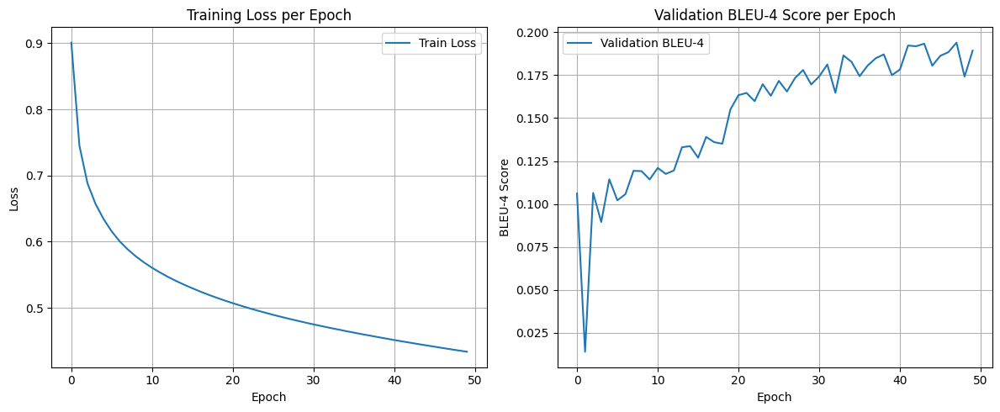

In [22]:
trainer.plot_history()

### MODEL EVALUATION

In [23]:
# Reload the best model
model = ImageCaptioning(CONFIG, processor, feature_extractor_model)

Restored from ./checkpoints/flickr30k/ckpt-21
Training history and states loaded.


In [28]:
model.evaluate_bleu_score(processor.test_data)


Evaluating BLEU on 7950 samples...


100%|██████████| 7950/7950 [17:13<00:00,  7.69it/s]  


BLEU-1: 0.5969
BLEU-2: 0.4137
BLEU-3: 0.2813
BLEU-4: 0.1925


{'bleu-1': 0.5968792036588647,
 'bleu-2': 0.41369554587124435,
 'bleu-3': 0.28127230932971753,
 'bleu-4': 0.1924719341430512}

In [29]:
model.evaluate_bleu_score(processor.val_data)


Evaluating BLEU on 15890 samples...


100%|██████████| 15890/15890 [34:51<00:00,  7.60it/s] 


BLEU-1: 0.5987
BLEU-2: 0.4135
BLEU-3: 0.2808
BLEU-4: 0.1920


{'bleu-1': 0.5987168427862842,
 'bleu-2': 0.4134927052862707,
 'bleu-3': 0.280807049504738,
 'bleu-4': 0.19195525184342818}

In [ ]:
# model.evaluate_bleu_score(processor.train_data)

In [30]:
model.run_prediction_samples(processor.test_data, num_samples=10)


--- Running Predictions for 10 Random Samples ---

--- Prediction Sample 1/10 (Image: 384672675.jpg) ---
Ground Truth Captions:
  1. a man in black attire is walking briskly in the pouring rain
  2. man running across street on a rainy day
  3. a man crossing the street in the rain
  4. a male is walking outside in the rain
  5. a man is walking in the rain
Generated Caption (Beam Search): a man is walking down a sidewalk
Prediction Time: 1251.79 ms

--- Prediction Sample 2/10 (Image: 3871713477.jpg) ---
Ground Truth Captions:
  1. a sidewalk artist wearing a black hoodie is creating a large installation of a woman on the sidewalk while being watched by many bystanders
  2. a sidewalk chalkartist finishing a lifelike portrait of a woman
  3. a girl is making a painting on the sidewalk with people watching
  4. a sidewalk artist crafting their newest masterpiece with chalk
  5. an artist is drawing a portrait
Generated Caption (Beam Search): a woman in a black jacket is sitting on a be

### SHOW AND TELL DEMO

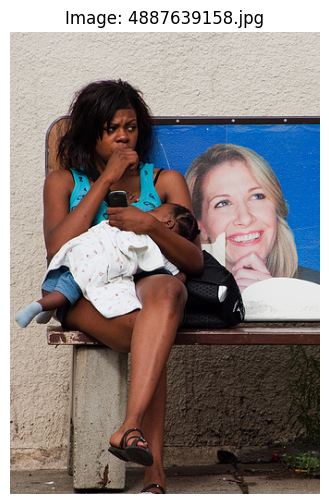


Ground Truth Captions:
  1. a woman in a blue tank top and shorts with a concerned look on her face sits on a bench holding a baby and a cellphone
  2. a woman in shorts and a blue tank top is sitting outside on a bench with a baby
  3. a black woman sits on a bench with her child while holding a phone
  4. a woman with her child is waiting on a bench
  5. a woman sitting on a bench with her child

Generated Caption (Beam Search): a woman in a white shirt and a woman in a white dress are sitting on a bench

Playing generated caption:


Audio saved to caption_audio_4887639158.mp3 and played.


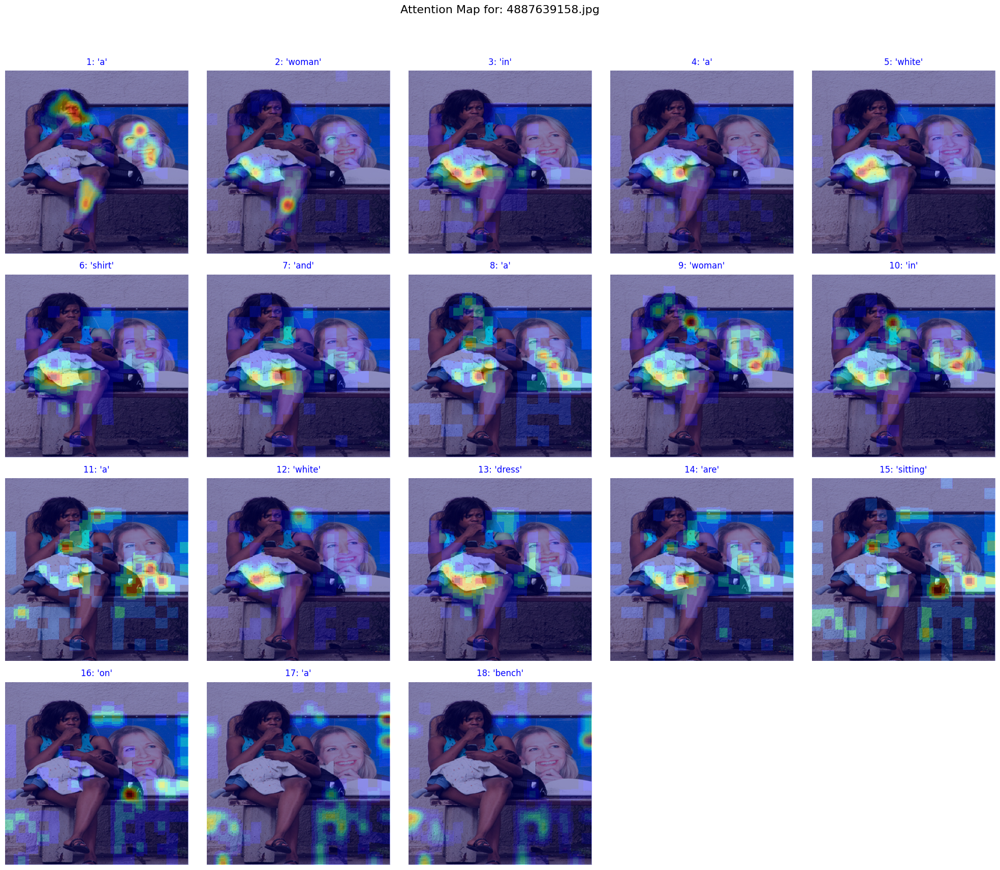

In [24]:
if processor.test_data:
    random_test_img_path, _ = random.choice(processor.test_data)
    model.demo(os.path.basename(random_test_img_path))
else:
    print("No test data available for demo.")

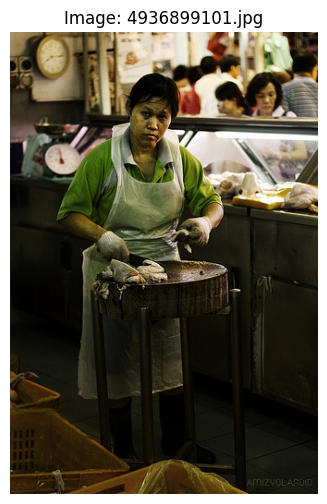


Ground Truth Captions:
  1. a seriousfaced woman in green and wearing an apron preparing the meat in front of her
  2. an asian woman in a green shirt and an apron is fixing some food inside a market
  3. a woman in a public market cutting a chicken into small pieces
  4. a woman wearing a green shirt and an apron is making food
  5. a woman in a green shirt is cooking

Generated Caption (Beam Search): a man is sitting at a table in a restaurant

Playing generated caption:


Audio saved to caption_audio_4936899101.mp3 and played.


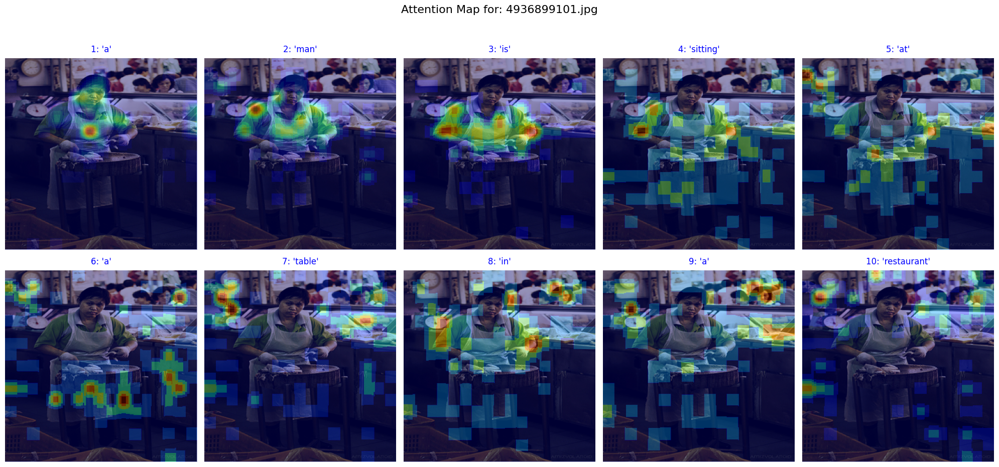

In [25]:
if processor.test_data:
    random_test_img_path, _ = random.choice(processor.test_data)
    model.demo(os.path.basename(random_test_img_path))
else:
    print("No test data available for demo.")

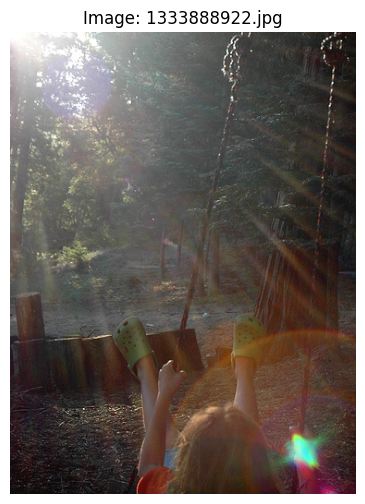


Ground Truth Captions:
  1. a brownhaired child in green shoes swings on a swing in a park near the woods
  2. the sun breaks through the trees as a child rides a swing
  3. a child wearing crocs sits on a swing in a wooded area
  4. a kid swings with his feet up in the air in a forest
  5. a child swings and the sunshine shines down on her

Generated Caption (Beam Search): a man is jumping into a fountain

Playing generated caption:


Audio saved to caption_audio_1333888922.mp3 and played.


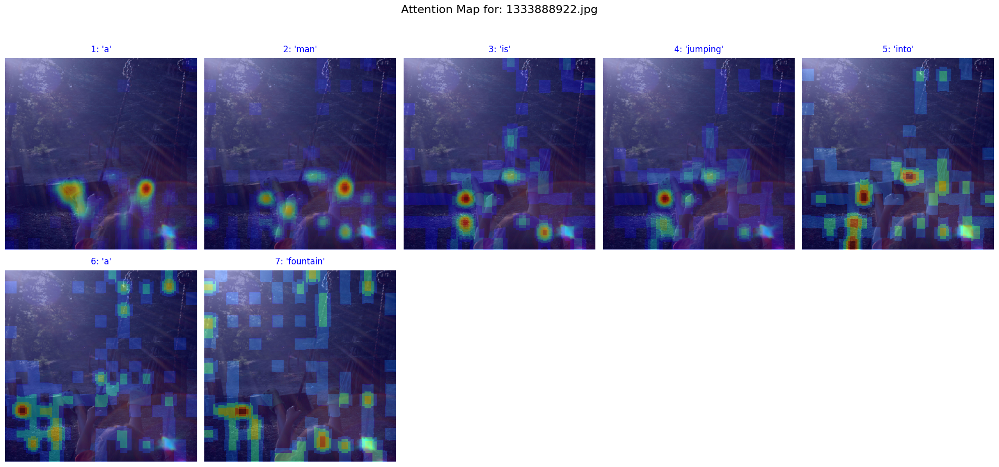

In [26]:
if processor.test_data:
    random_test_img_path, _ = random.choice(processor.test_data)
    model.demo(os.path.basename(random_test_img_path))
else:
    print("No test data available for demo.")

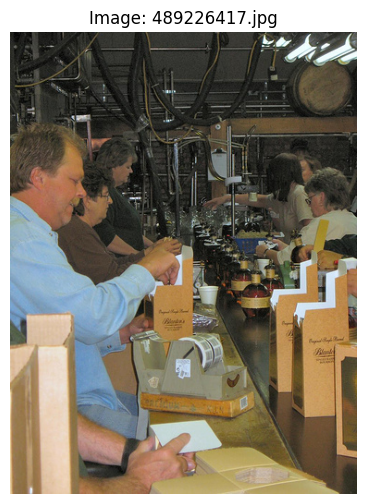


Ground Truth Captions:
  1. people man the lines in a factory as each one of them has a different and specific job to do
  2. people are lined up facing each other with bottles of amber liquid boxes and labels
  3. a group of middleaged men and women are packaging bottles on an assembly line
  4. these employees are working at a factory packaging their product
  5. a group of people working to package the drink

Generated Caption (Beam Search): a man in a blue shirt is sitting at a table in a restaurant

Playing generated caption:


Audio saved to caption_audio_489226417.mp3 and played.


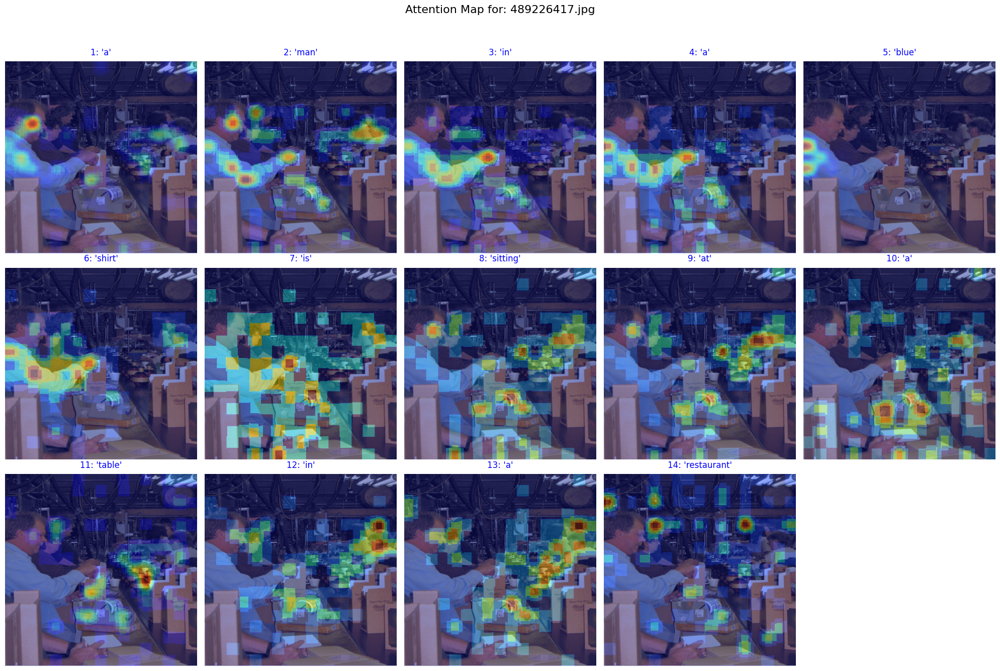

In [27]:
if processor.test_data:
    random_test_img_path, _ = random.choice(processor.test_data)
    model.demo(os.path.basename(random_test_img_path))
else:
    print("No test data available for demo.")

### Comparision with other notable work with Flickr-8k

|| Model / Paper (Flickr-8k test split) | BLEU-1 | BLEU-2 | BLEU-3 | BLEU-4 |
|-|-------------------------------------|:----:|:-----:|:-----:|:------:|
|1| **My best checkpoint (w/ Attn)**    | - | -  | -  | -   |
|2| **Total train (w/ Attn)**           | - | -  | -  | -   |
|3| **Total unseen test (w/ Attn)**     | - | -  | -  | -   |
|4| Xu et al., 2015 — *Soft-Attention*  | 0.67 | 0.448 | 0.299 | 0.195  |
|5| Xu et al., 2015 — *Hard-Attention*  | 0.67 | 0.457 | 0.314 | 0.213  |
|6| Google NIC (Vinyals et al., 2015)   | 0.63 | 0.41  | 0.27  | 0.160* |

* <i>BLEU-4 for NIC comes from a later re-implementation that reports full n-gram scores on the official Flickr-8k split.</i>


----------

**References**

[1]: Kelvin Xu, Jimmy Lei Ba, Ryan Kiros, Kyunghyun Cho, Aaron Courville,  
      Ruslan Salakhutdinov, Richard Zemel & Yoshua Bengio.  
      *Show, Attend and Tell: Neural Image Caption Generation with Visual Attention*.  
      Proceedings of the 32nd International Conference on Machine Learning (ICML 2015),  
      PMLR 37, pp. 2048–2057. :contentReference[oaicite:0]{index=0}

[2]: Oriol Vinyals, Alexander Toshev, Samy Bengio & Dumitru Erhan.  
      *Show and Tell: A Neural Image Caption Generator*.  
      Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR 2015),  
      pp. 3156–3164. DOI 10.1109/CVPR.2015.7298935. :contentReference[oaicite:1]{index=1}
